In [1]:
import pickle
from collections import defaultdict
from rdkit import Chem, Geometry
from rdkit.Chem import AllChem, rdFMCS, Draw
from simtk import unit
from neutromeratio.utils import generate_rdkit_mol
from neutromeratio.analysis import calc_molecular_graph_entropy, calculate_weighted_energy, prune_conformers, compute_kl_divergence, bootstrap_rmse_r
from neutromeratio.plotting import plot_correlation_analysis
from neutromeratio.constants import br_containing_mols
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
sns.set_context('paper')
sns.set(color_codes=True)

[utils.py:141 - _init_num_threads()] NumExpr defaulting to 8 threads.


In [2]:
exp_results = pickle.load(open('../data/results/exp_results.pickle', 'rb'))
qm_results = pickle.load(open('../data/results/QM/qm_results_final.pickle', 'rb'))

In [3]:
# method 1: B3LYP/aug-cc-pVTZ in SMD 
# method 2: B3LYP/aug-cc-pVTZ/B3LYP/aug-cc-pVTZ/SMD on in respective phase optimized geometry
# method 3: B3LYP/aug-cc-pVTZ/B3LYP/6-31G/SMD on in respective phase optimized geometry

In [7]:
def draw_mols(x_list:list, y_list:list, names:list):
    
    error_names = []
    error = []
    
    for x, y, name in zip(x_list, y_list, names):
        e = abs(float(x) - float(y))
        if e > 10:
            error_names.append(name)
            error.append(e)

    ps = rdFMCS.MCSParameters()
    ps.AtomCompareParameters.RingMatchesRingOnly = True
    ps.SetAtomTyper(rdFMCS.AtomCompare.CompareAny)
    for name in error_names:
        mol1, mol2 = Chem.MolFromSmiles(exp_results[name]['t1-smiles']), Chem.MolFromSmiles(exp_results[name]['t2-smiles'])
        mcs=Chem.MolFromSmarts(rdFMCS.FindMCS([mol1,mol2], bondCompare=Chem.rdFMCS.BondCompare.CompareOrder.CompareAny).smartsString)
        AllChem.Compute2DCoords(mol1)
        match1=mol1.GetSubstructMatch(mcs)
        match2=mol2.GetSubstructMatch(mcs)
        coords=[mol1.GetConformer().GetAtomPosition(x) for x in match1]
        coords2D = [Geometry.Point2D(pt.x,pt.y) for pt in coords]
        coordDict={}
        for i,coord in enumerate(coords2D):
            coordDict[match2[i]] = coord
        AllChem.Compute2DCoords(mol2,coordMap=coordDict)
    Draw.MolsToGridImage([mol1,mol2],subImgSize=(250,250),molsPerRow=2)

def plot_two_distributions(x_list:list, y_list:list):
    fontsize = 27
    plt.figure(figsize=[8, 8], dpi=300)
    plt.subplot(211)
    sns.distplot(x_list, kde=True, rug=True, bins=15, label='$\Delta_{r}G_{solv}^{exp}$')
    sns.distplot(y_list, kde=True, rug=True, bins=15, label='$\Delta_{r}G_{solv}^{calc}$')

    plt.xlabel('$\Delta_{r}G_{solv}$ [kcal/mol]', fontsize=fontsize)
    plt.ylabel('Probability', fontsize=fontsize)
    plt.axvline(0,0,15, color='red')
    kl = compute_kl_divergence(np.array(x_list), np.array(y_list))
    rmse, mae, rho = (bootstrap_rmse_r(np.array(x_list), np.array(y_list), 1000))
    plt.text(-13.0, 0.15, f"MAE$ = {mae}$", fontsize=fontsize)
    plt.text(-13.0, 0.13, f"RMSE$ = {rmse}$", fontsize=fontsize)
    plt.text(-13.0, 0.11, f"KL$ = {kl:.2f}$", fontsize=fontsize)
    ax = plt.gca()
    plt.setp(ax.get_xticklabels(),  fontsize=18)
    plt.setp(ax.get_yticklabels(),  fontsize=18)
    plt.legend(fontsize=fontsize)
    plt.ylabel('Probability')
    plt.yticks([])
    plt.tight_layout()
    plt.subplot(212)
    sns.distplot(np.array(x_list) - np.array(y_list), kde=True, rug=True, bins=15, label='$\Delta_{r}G_{solv}^{exp} - \Delta_{r}G_{solv}^{calc}$')
    plt.xlabel('$\Delta_{r}G_{solv}^{exp} - \Delta_{r}G_{solv}^{calc}$ [kcal/mol]', fontsize=fontsize)
    plt.ylabel('Probability', fontsize=fontsize)
    plt.axvline(0,0,15, color='red')
    kl = compute_kl_divergence(np.array(x_list), np.array(y_list))
    rmse, mae, rho = (bootstrap_rmse_r(np.array(x_list), np.array(y_list), 1000))
    plt.legend(fontsize=fontsize)
    plt.yticks([])

    plt.ylabel('Probability')
    ax = plt.gca()
    plt.setp(ax.get_xticklabels(),  fontsize=18)
    plt.setp(ax.get_yticklabels(),  fontsize=18)

    plt.tight_layout()
    plt.show()

def combine_conformations(list_of_mols_vac:list, list_of_mols_solv:list):
    molecule_with_multiple_confs_vac = Chem.Mol(list_of_mols_vac[0])
    molecule_with_multiple_confs_vac.RemoveAllConformers()
    
    molecule_with_multiple_confs_solv = Chem.Mol(list_of_mols_solv[0])
    molecule_with_multiple_confs_solv.RemoveAllConformers()
    
    molecules_vac  = []
    molecules_solv = []
    
    vac_conf = dict(zip([int(m.GetProp('conf-id')) for m in list_of_mols_vac], list_of_mols_vac)) 
    solv_conf = dict(zip([int(m.GetProp('conf-id')) for m in list_of_mols_solv], list_of_mols_solv)) 

    for conf_id in vac_conf:
        if conf_id not in solv_conf.keys():
            #print(f"Skipping: {conf_id}")
            pass
        else:
            conf_vac = vac_conf[conf_id].GetConformer()
            molecule_with_multiple_confs_vac.AddConformer(conf_vac, assignId=True)
            molecules_vac.append(vac_conf[conf_id])
            
            conf_solv = solv_conf[conf_id].GetConformer()
            molecule_with_multiple_confs_solv.AddConformer(conf_solv, assignId=True)
            molecules_solv.append(solv_conf[conf_id])
    
    return molecule_with_multiple_confs_vac, molecule_with_multiple_confs_solv, molecules_vac, molecules_solv

def get_min_free_energy_in_solution_method1(m_solv:list, correct_for_symmetry:bool=False):
    
    # getting min values for vac/solv energy and free energy in vac
    if correct_for_symmetry:
        entropy_corr = calc_molecular_graph_entropy(m_solv[0])[0].value_in_unit(unit.kilocalorie_per_mole)
    else:
        entropy_corr = 0.0
    G_solv_min = min([float(m.GetProp('G with S_rot corrected')) + entropy_corr  for m in m_solv])
    # getting min solvation free energty
    return G_solv_min * unit.kilocalorie_per_mole

def get_free_energy_in_solution_method1(solv_conf:Chem.Mol, m_solv:list, correct_for_symmetry:bool=False):

    free_energy_in_solution = []
    if correct_for_symmetry:
        entropy_corr = calc_molecular_graph_entropy(solv_conf)[0].value_in_unit(unit.kilocalorie_per_mole)
    else:
        entropy_corr = 0.0   
    
    # iterating over gas confs, adding energy in gas/solvation and free energy in gas for each conf 
    
    for m in m_solv:
        G_solv = float(m.GetProp('G with S_rot corrected')) + entropy_corr
        free_energy_in_solution.append(G_solv * unit.kilocalorie_per_mole)
    
    mols, e_list = prune_conformers(solv_conf, free_energy_in_solution, rmsd_threshold=0.1)
    return e_list

def get_min_free_energy_in_solution_method2(m_vac:list, m_solv:list, correct_for_symmetry:bool=False):
    
    if correct_for_symmetry:
        entropy_corr = calc_molecular_graph_entropy(solv_conf)[0].value_in_unit(unit.kilocalorie_per_mole)
    else:
        entropy_corr = 0.0   

    # getting min values for vac/solv energy and free energy in vac
    dE_vac_min = min([float(m.GetProp('E_B3LYP_pVTZ')) for m in m_vac])
    dE_solv_min = min([float(m.GetProp('E_B3LYP_pVTZ')) for m in m_solv])
    G_vac_min = min([float(m.GetProp('G with S_rot corrected')) + entropy_corr for m in m_vac])
    # getting min solvation free energty
    return (G_vac_min + (dE_solv_min - dE_vac_min))* unit.kilocalorie_per_mole

def get_free_energy_in_solution_method2(vac_conf:Chem.Mol, m_vac:list, m_solv:list, correct_for_symmetry:bool=False):

    if correct_for_symmetry:
        entropy_corr = calc_molecular_graph_entropy(solv_conf)[0].value_in_unit(unit.kilocalorie_per_mole)
    else:
        entropy_corr = 0.0   

    
    free_energy_in_solution = []
    # iterating over gas confs, adding energy in gas/solvation and free energy in gas for each conf 
    for m_v, m_s in zip(m_vac, m_solv):
        G_gas = float(m_v.GetProp('G with S_rot corrected')) + entropy_corr
        E_gas = float(m_v.GetProp('E_B3LYP_pVTZ'))
        E_solv = float(m_s.GetProp('E_B3LYP_pVTZ'))

        free_energy_in_solution.append((G_gas + (E_solv-E_gas)) * unit.kilocalorie_per_mole)
    
    mols, e_list = prune_conformers(vac_conf,  free_energy_in_solution, rmsd_threshold=0.1)
    return e_list

def get_min_free_energy_in_solution_method3(m_vac:list, m_solv:list, correct_for_symmetry:bool=False):
    
    if correct_for_symmetry:
        entropy_corr = calc_molecular_graph_entropy(solv_conf)[0].value_in_unit(unit.kilocalorie_per_mole)
    else:
        entropy_corr = 0.0   

    # getting min values for vac/solv energy and free energy in vac
    dE_vac_min = min([float(m.GetProp('E_B3LYP_631G_gas')) for m in m_vac])
    dE_solv_min = min([float(m.GetProp('E_B3LYP_631G_solv')) for m in m_solv])
    G_vac_min = min([float(m.GetProp('G with S_rot corrected')) + entropy_corr for m in m_vac])
    # getting min solvation free energty
    return (G_vac_min + (dE_solv_min - dE_vac_min))* unit.kilocalorie_per_mole


def get_free_energy_in_solution_method3(vac_conf:Chem.Mol, m_vac:list, m_solv:list, correct_for_symmetry:bool=False):

    if correct_for_symmetry:
        entropy_corr = calc_molecular_graph_entropy(solv_conf)[0].value_in_unit(unit.kilocalorie_per_mole)
    else:
        entropy_corr = 0.0   

    free_energy_in_solution = []
    # iterating over gas confs, adding energy in gas/solvation and free energy in gas for each conf 
    for m_v, m_s in zip(m_vac, m_solv):
        G_gas = float(m_v.GetProp('G with S_rot corrected')) + entropy_corr
        E_gas = float(m_v.GetProp('E_B3LYP_631G_gas'))
        E_solv = float(m_s.GetProp('E_B3LYP_631G_solv'))

        free_energy_in_solution.append((G_gas + (E_solv-E_gas)) * unit.kilocalorie_per_mole)
    
    mols, e_list = prune_conformers(vac_conf,  free_energy_in_solution, rmsd_threshold=0.1)
    return e_list


def calc_rot_entropy(deg: int):
    return -1 * gas_constant * np.log(deg)


def combine_y_and_exp(method, combining_method):
    x_list=[]
    y_list=[]
    names = []
    for name in b3lyp_results:
        if method == 'method3' and name in br_containing_mols:
            # skip bromid containing molecules
            print(name)
            continue

        x = exp_results[name]['energy [kcal/mol]']
        y = b3lyp_results[name][f"t2-free-energy-solv-{method}-{combining_method}"] - b3lyp_results[name][f"t1-free-energy-solv-{method}-{combining_method}"]
        x = x.value_in_unit(unit.kilocalorie_per_mole)
        y = y.value_in_unit(unit.kilocalorie_per_mole)
        if x < 0.0:
            x *= -1.
            y *= -1.
        x_list.append(x)   
        y_list.append(y)
        names.append(name)

    if(len(x_list) != len(y_list)):
        print(method)
        print(combining_method)
        raise RuntimeError()

    error = []
    for i in range(len(x_list)):
        error.append(x_list[i] - y_list[i])
    outlier = []
    for i in range(len(x_list)):
        o = abs(x_list[i] - y_list[i])
        if o > 10:
            outlier.append(names[i])
    return x_list, y_list, names, error, outlier

def plot_single_dist(x_list, y_list, label):
    fontsize = 27
    plt.figure(figsize=[8, 8], dpi=300)
    plt.ylabel('Probability', fontsize=fontsize)

    from neutromeratio.analysis import compute_kl_divergence, bootstrap_rmse_r
    sns.distplot(np.array(x_list) - np.array(y_list), kde=True, rug=True, bins=15, label="Boltzmann weighting - Minimum")
    rmse, mae, rho = (bootstrap_rmse_r(np.array(x_list), np.array(y_list), 1000))
    kl = compute_kl_divergence(np.array(x_list), np.array(y_list))
    #plt.text(-1.5, 1.5, f"RMSE$ = {rmse}$", fontsize=fontsize)
    #plt.text(-1.5, 1.35, f"MAE$ = {mae}$", fontsize=fontsize)
    #plt.text(8.0, 0.04, f"KL$ = {kl:.2f}$", fontsize=fontsize)
    plt.xlabel(label, fontsize=fontsize)
    plt.axvline(0,0,15, color='red')

    #plt.legend(fontsize=fontsize)
    plt.yticks([])
    plt.show()


def combine_x_and_y(method):
    x_list=[]
    y_list=[]
    names = []
    for name in b3lyp_results:
        if method == 'method3' and name in br_containing_mols:
            # skip bromid containing molecules
            print(name)
            continue

        x = b3lyp_results[name][f"t2-free-energy-solv-{method}-mm"] - b3lyp_results[name][f"t1-free-energy-solv-{method}-mm"]
        y = b3lyp_results[name][f"t2-free-energy-solv-{method}-min"] - b3lyp_results[name][f"t1-free-energy-solv-{method}-min"]
        x = x.value_in_unit(unit.kilocalorie_per_mole)
        y = y.value_in_unit(unit.kilocalorie_per_mole)
        if x < 0.0:
            x *= -1.
            y *= -1.
        x_list.append(x)   
        y_list.append(y)
        names.append(name)

    if(len(x_list) != len(y_list)):
        print(method)
        print(combining_method)
        raise RuntimeError()

    error = []
    for i in range(len(x_list)):
        error.append(x_list[i] - y_list[i])
    
    return x_list, y_list, names, error


def plot_diff(x_list:list, y_list:list):
    fontsize = 27
    from neutromeratio.analysis import compute_kl_divergence, bootstrap_rmse_r
    plt.figure(figsize=[8, 8], dpi=300)


    plt.subplot(211)
    sns.distplot(x_list, kde=True, rug=True, bins=15, label='$\Delta G_{solv}^{exp}$')
    sns.distplot(y_list, kde=True, rug=True, bins=15, label='$\Delta G_{solv}^{calc}$')

    plt.xlabel('$\Delta G_{solv}$ [kcal/mol]', fontsize=fontsize)
    plt.ylabel('Probability', fontsize=fontsize)
    plt.axvline(0,0,15, color='red')
    kl = compute_kl_divergence(np.array(x_list), np.array(y_list))
    rmse, mae, rho = (bootstrap_rmse_r(np.array(x_list), np.array(y_list), 1000))
    plt.text(-13.0, 0.15, f"MAE$ = {mae}$", fontsize=fontsize)
    plt.text(-13.0, 0.13, f"RMSE$ = {rmse}$", fontsize=fontsize)
    plt.text(-13.0, 0.11, f"KL$ = {kl:.2f}$", fontsize=fontsize)
    ax = plt.gca()
    plt.setp(ax.get_xticklabels(),  fontsize=18)
    plt.setp(ax.get_yticklabels(),  fontsize=18)
    plt.legend(fontsize=fontsize)
    plt.ylabel('Probability')
    plt.yticks([])
    plt.tight_layout()
    plt.subplot(212)
    sns.distplot(np.array(x_list) - np.array(y_list), kde=True, rug=True, bins=15, label='$\Delta G_{solv}^{exp} - \Delta G_{solv}^{calc}$')
    plt.xlabel('$\Delta G_{solv}^{exp} - \Delta G_{solv}^{calc}$ [kcal/mol]', fontsize=fontsize)
    plt.ylabel('Probability', fontsize=fontsize)
    plt.axvline(0,0,15, color='red')
    kl = compute_kl_divergence(np.array(x_list), np.array(y_list))
    rmse, mae, rho = (bootstrap_rmse_r(np.array(x_list), np.array(y_list), 1000))
    plt.legend(fontsize=fontsize)
    plt.yticks([])

    plt.ylabel('Probability')
    ax = plt.gca()
    plt.setp(ax.get_xticklabels(),  fontsize=18)
    plt.setp(ax.get_yticklabels(),  fontsize=18)

    plt.tight_layout()



    plt.show()

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


<Figure size 2400x2400 with 0 Axes>

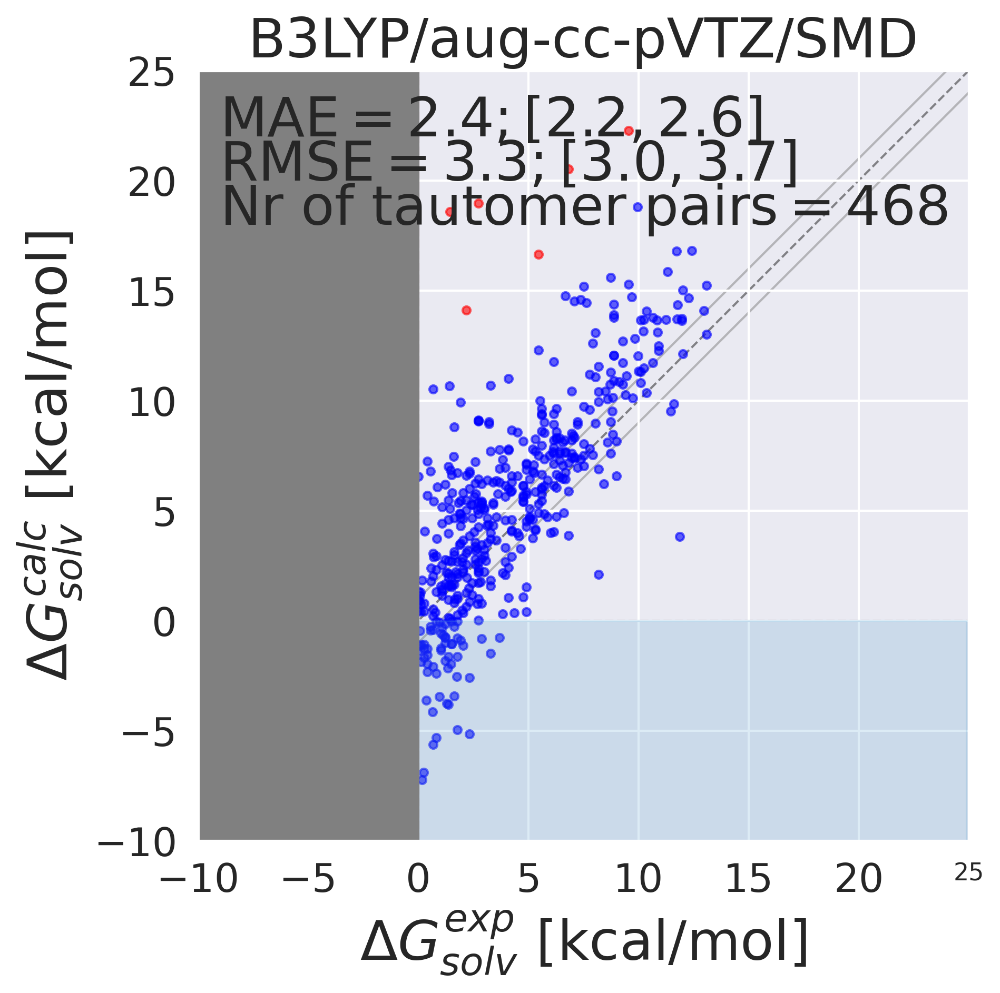

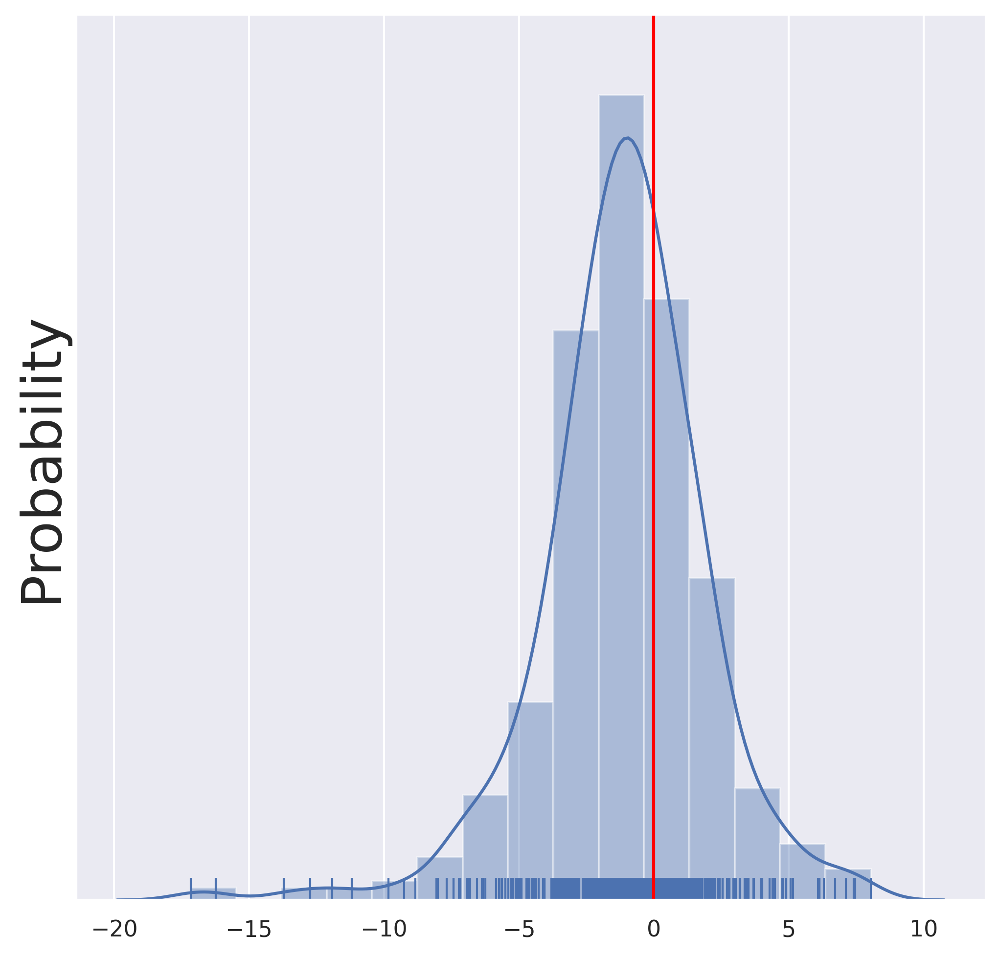

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

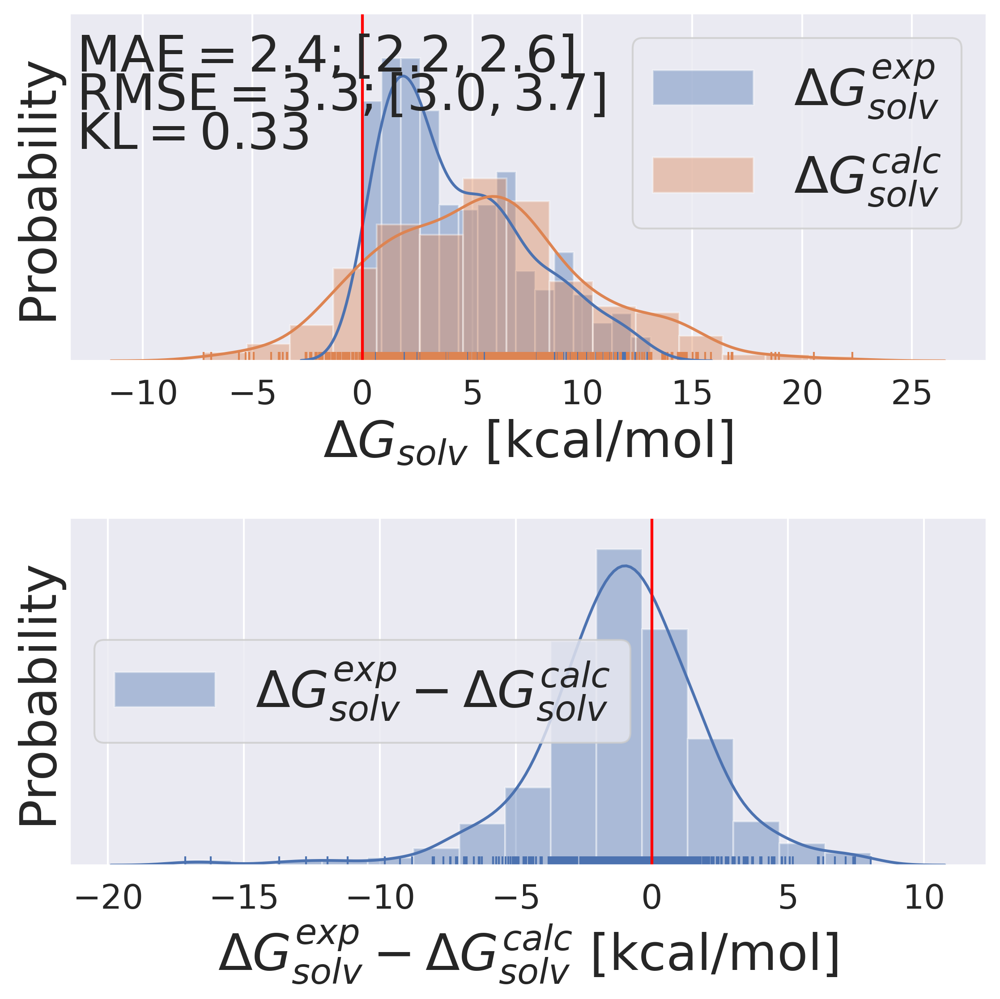

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


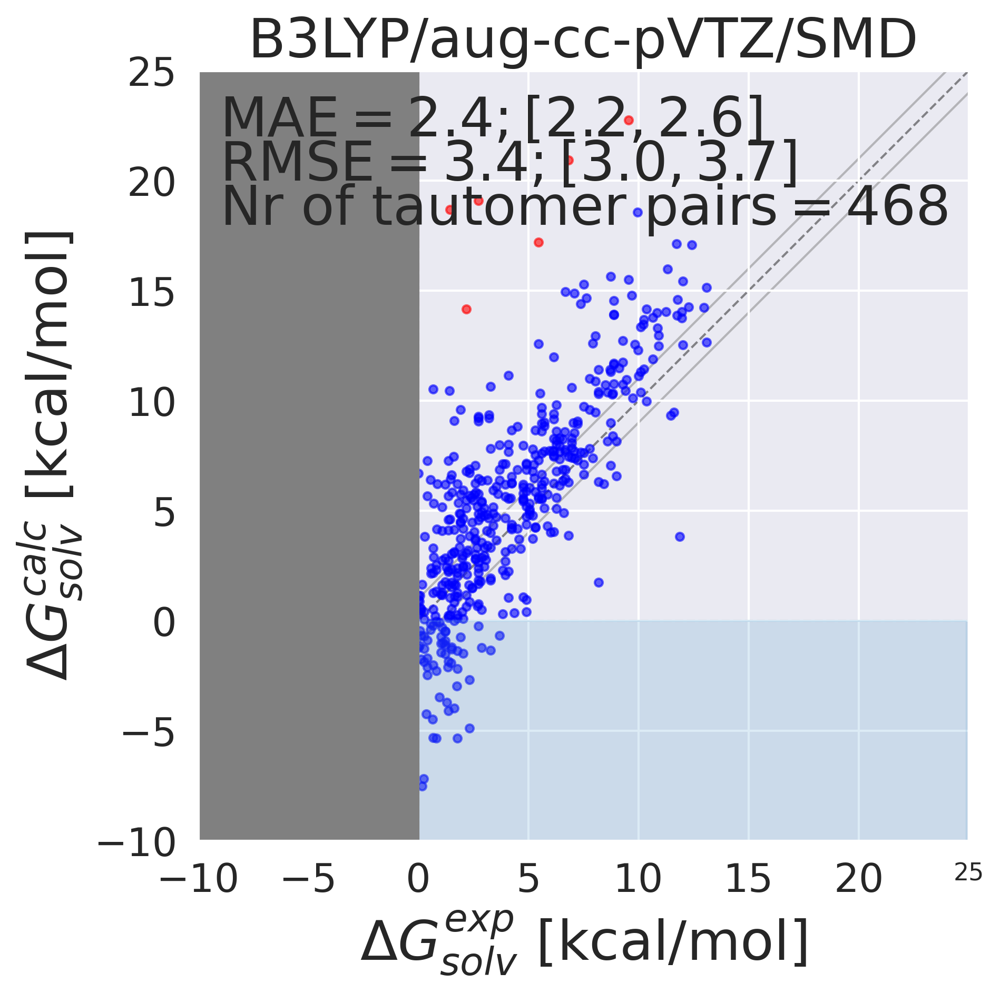

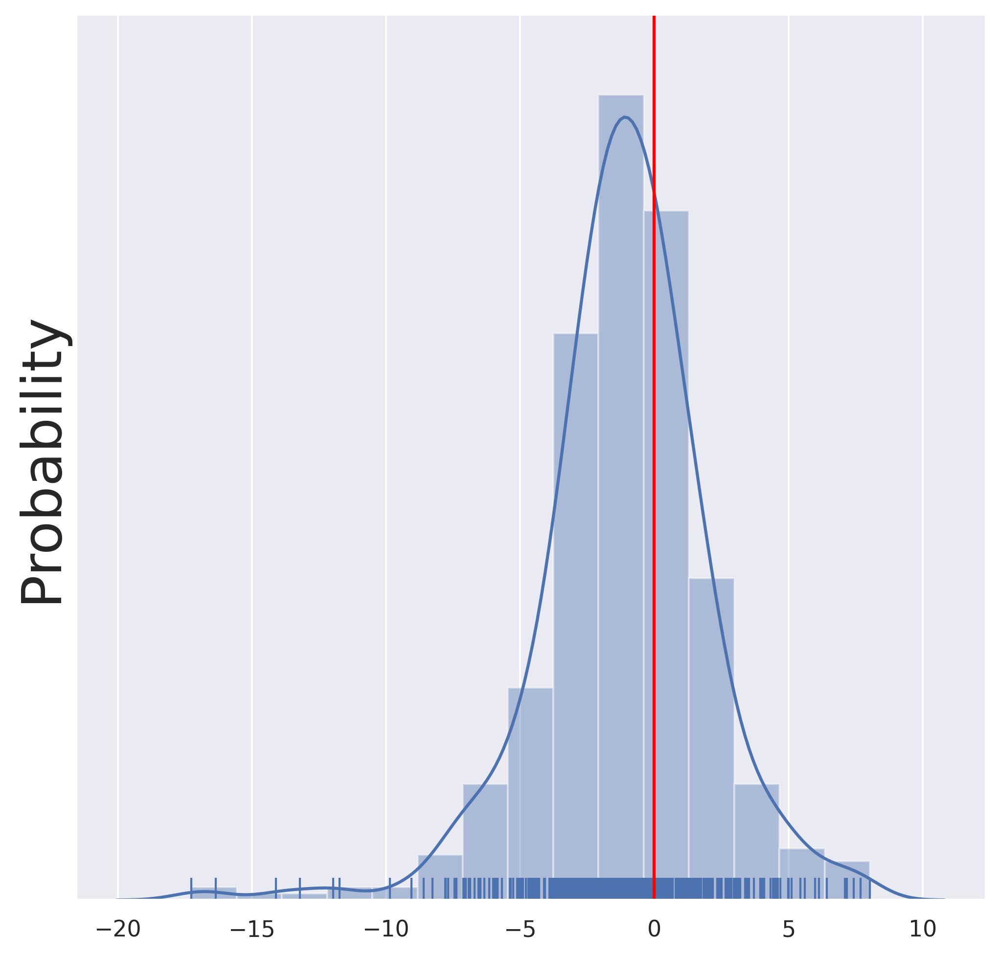

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

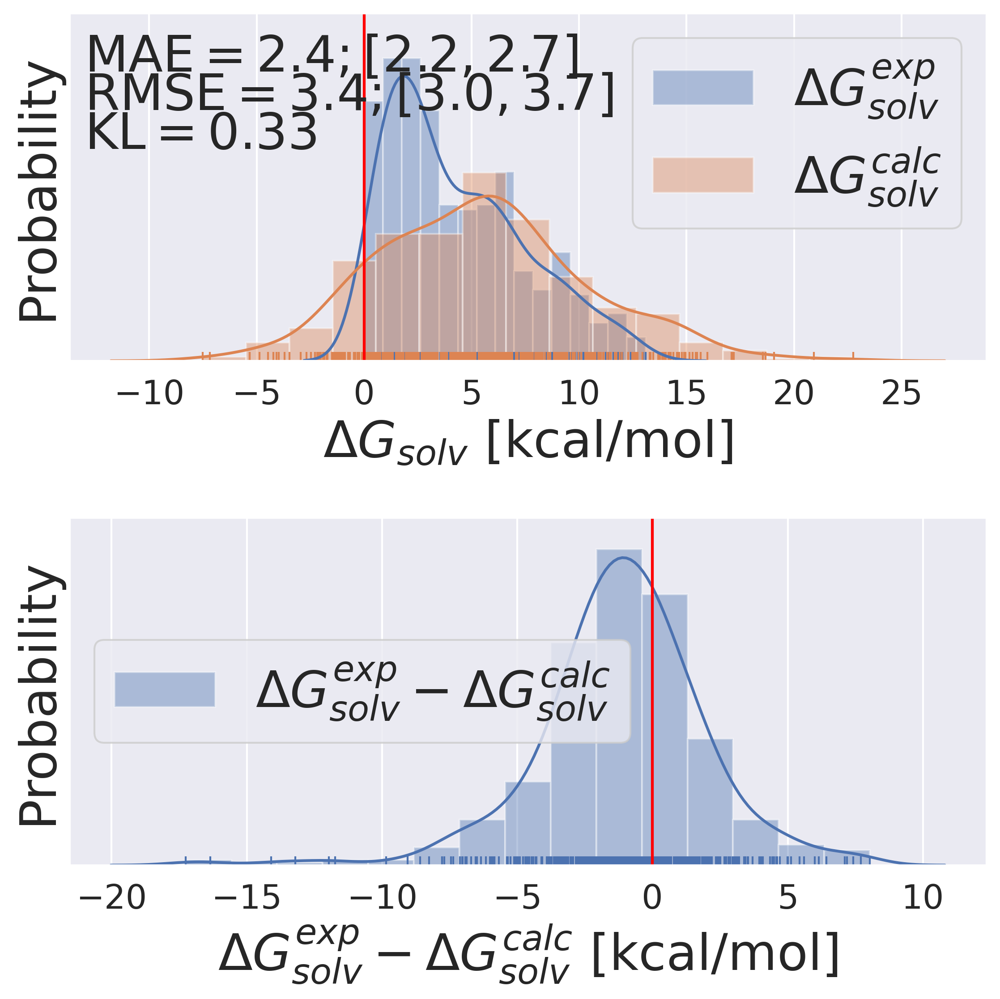

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


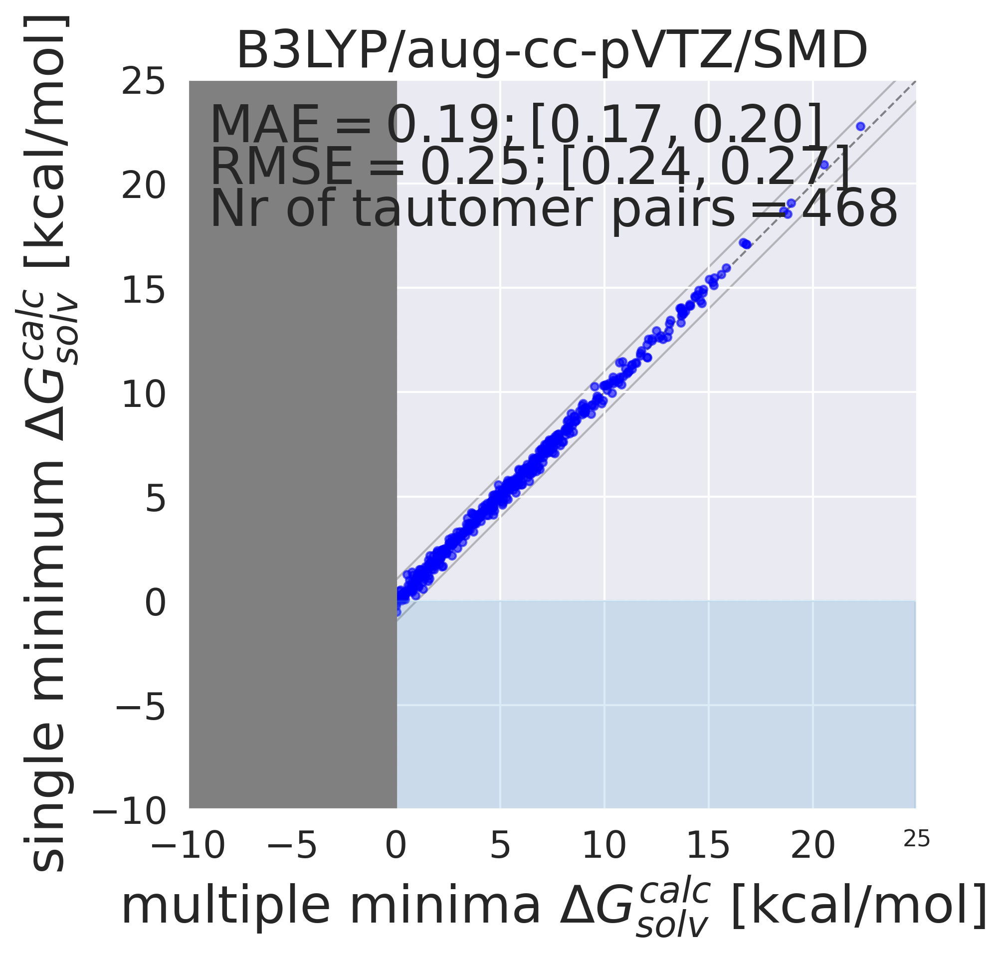

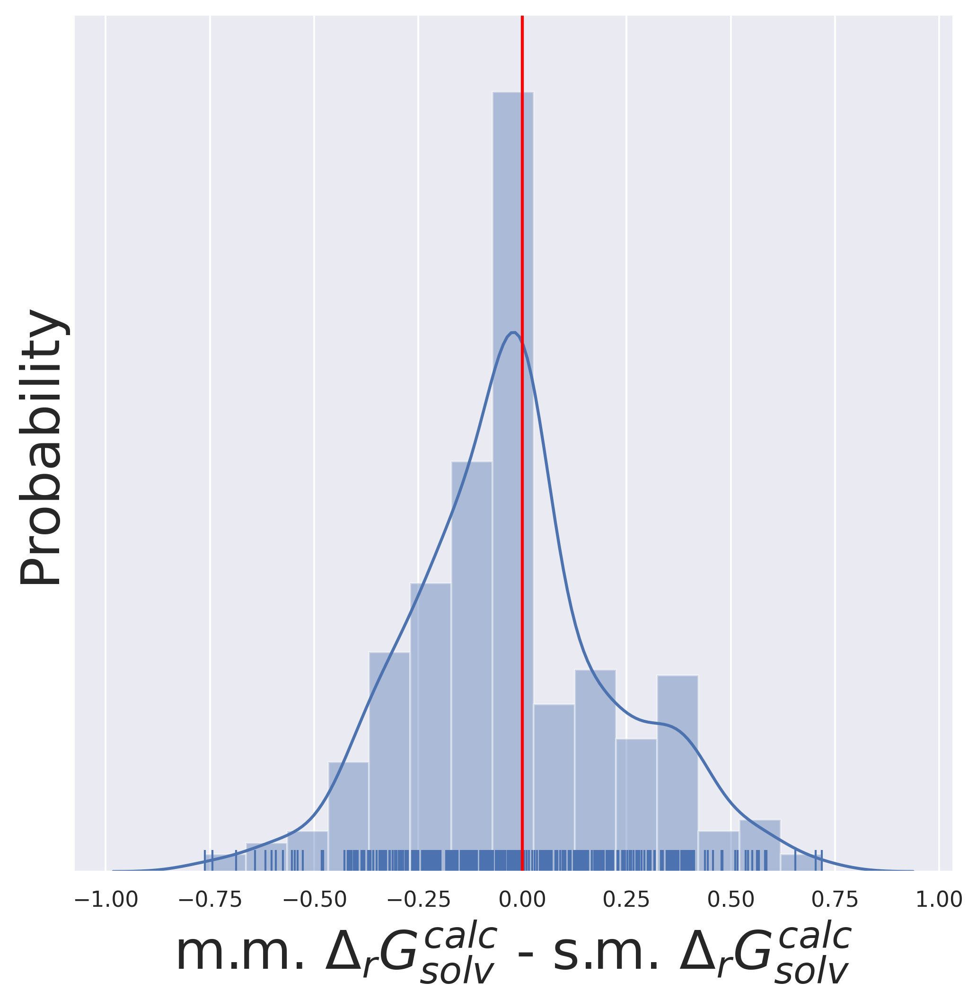

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


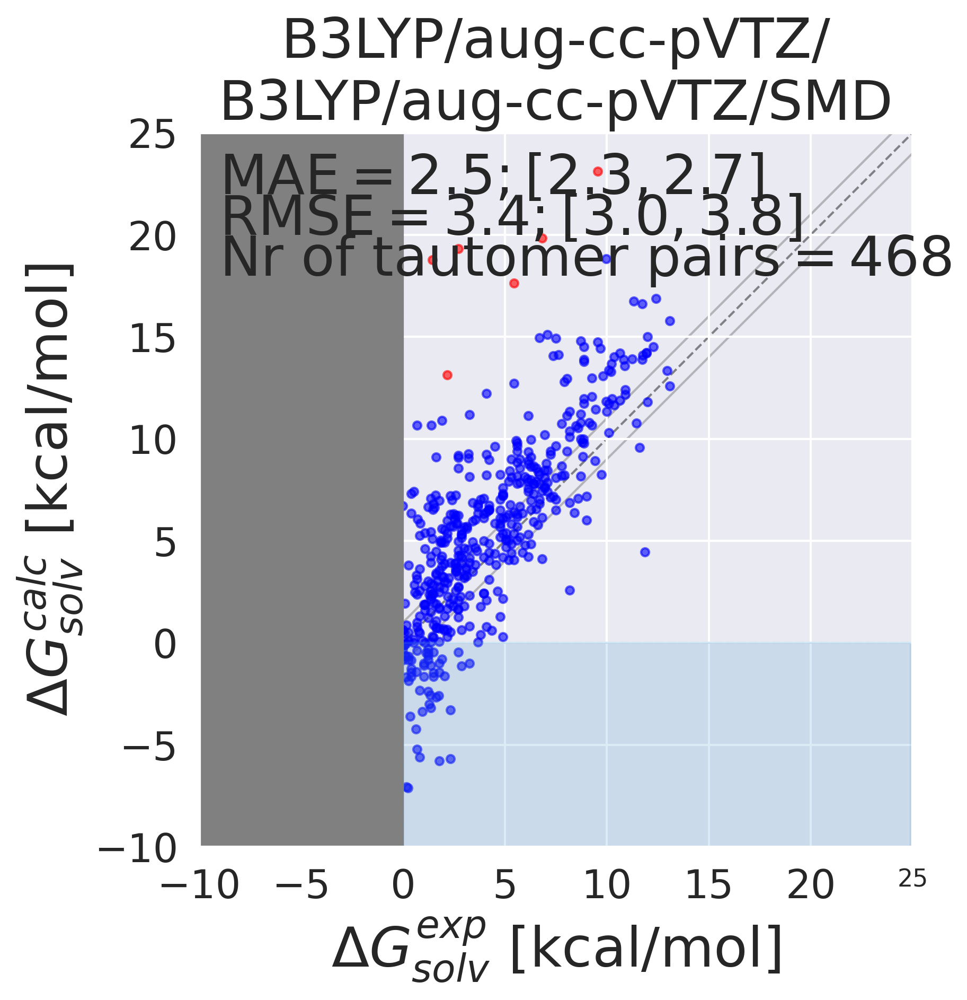

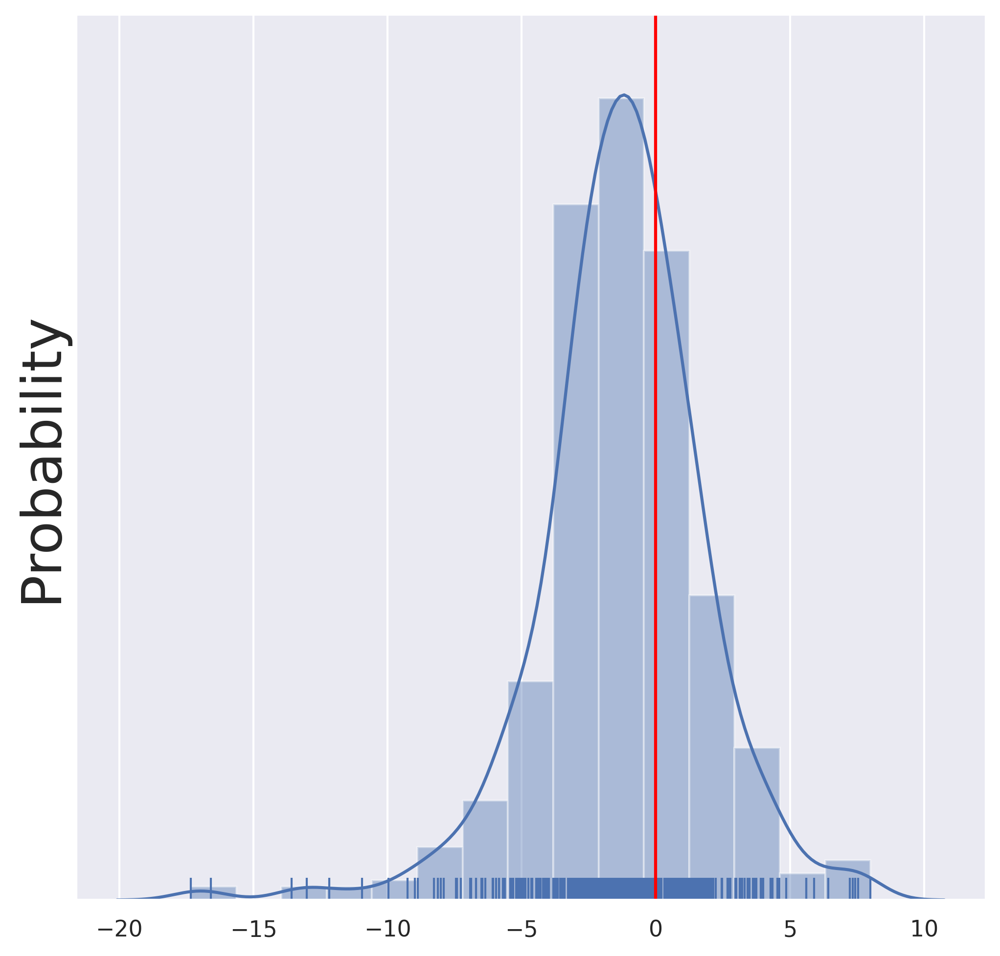

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

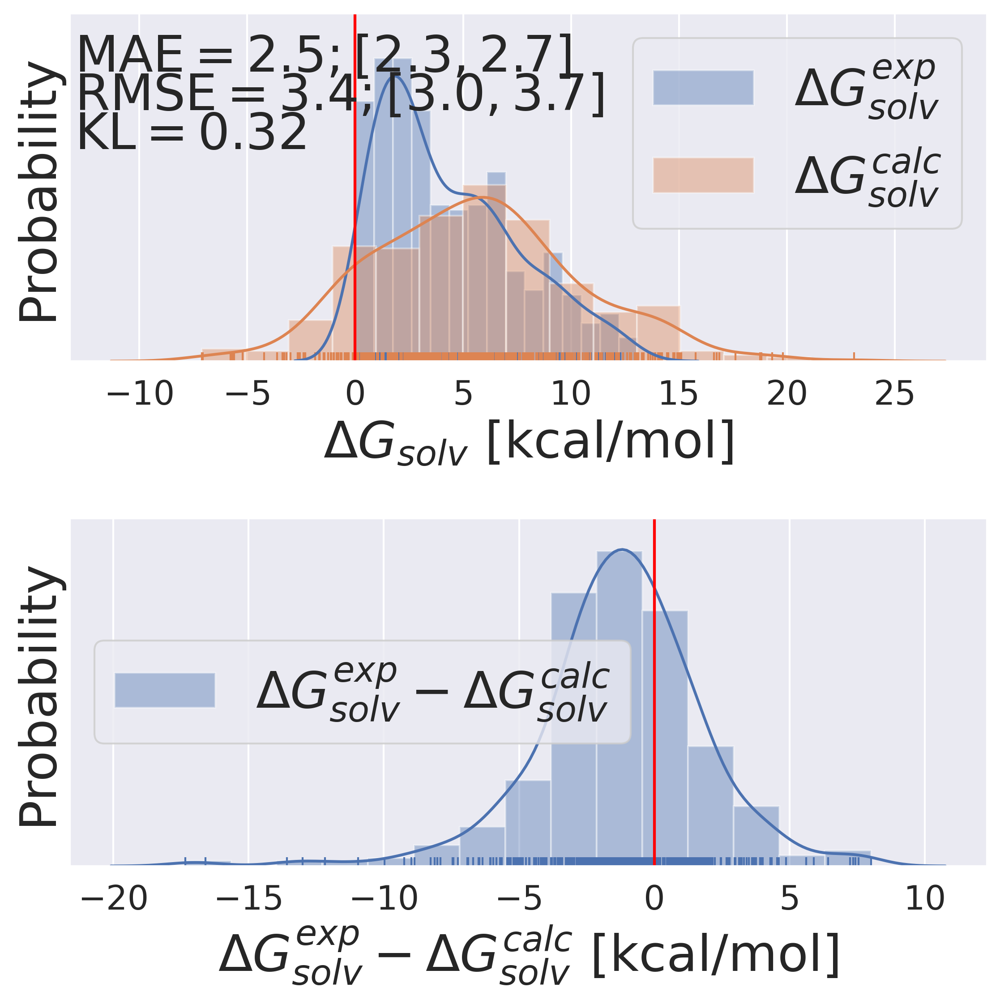

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


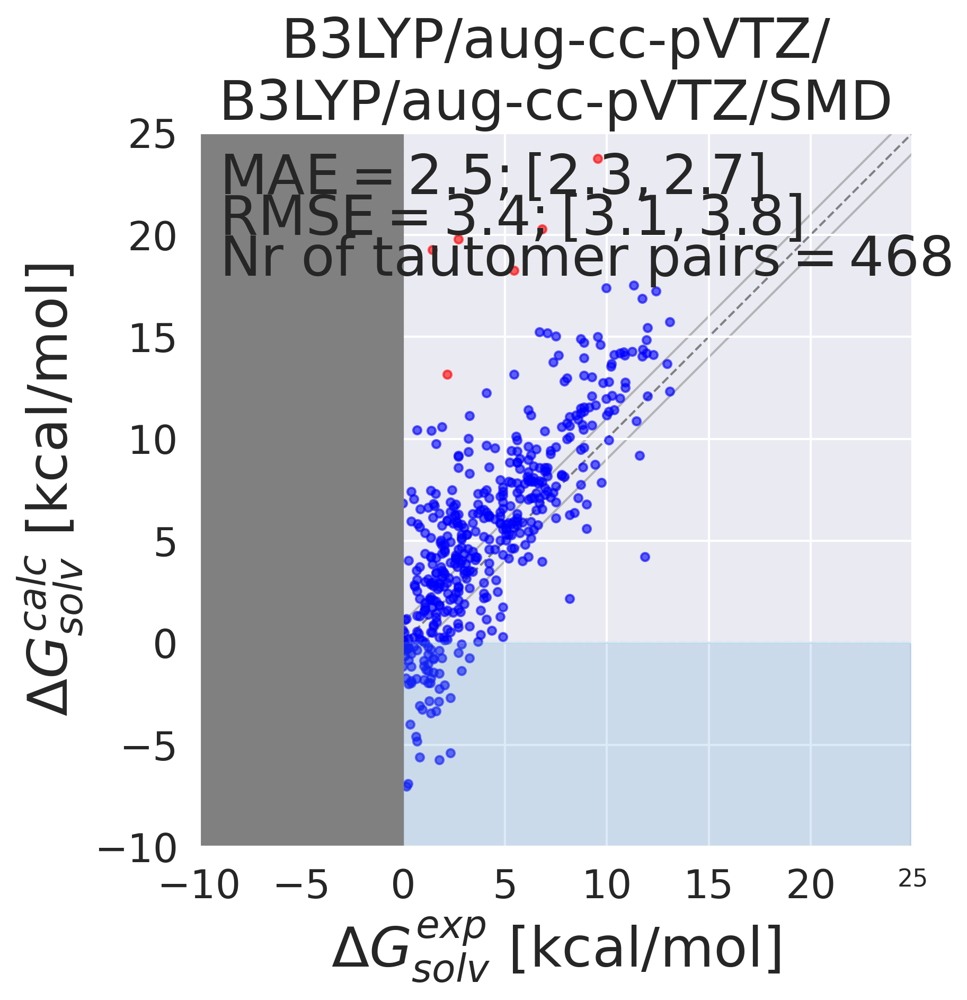

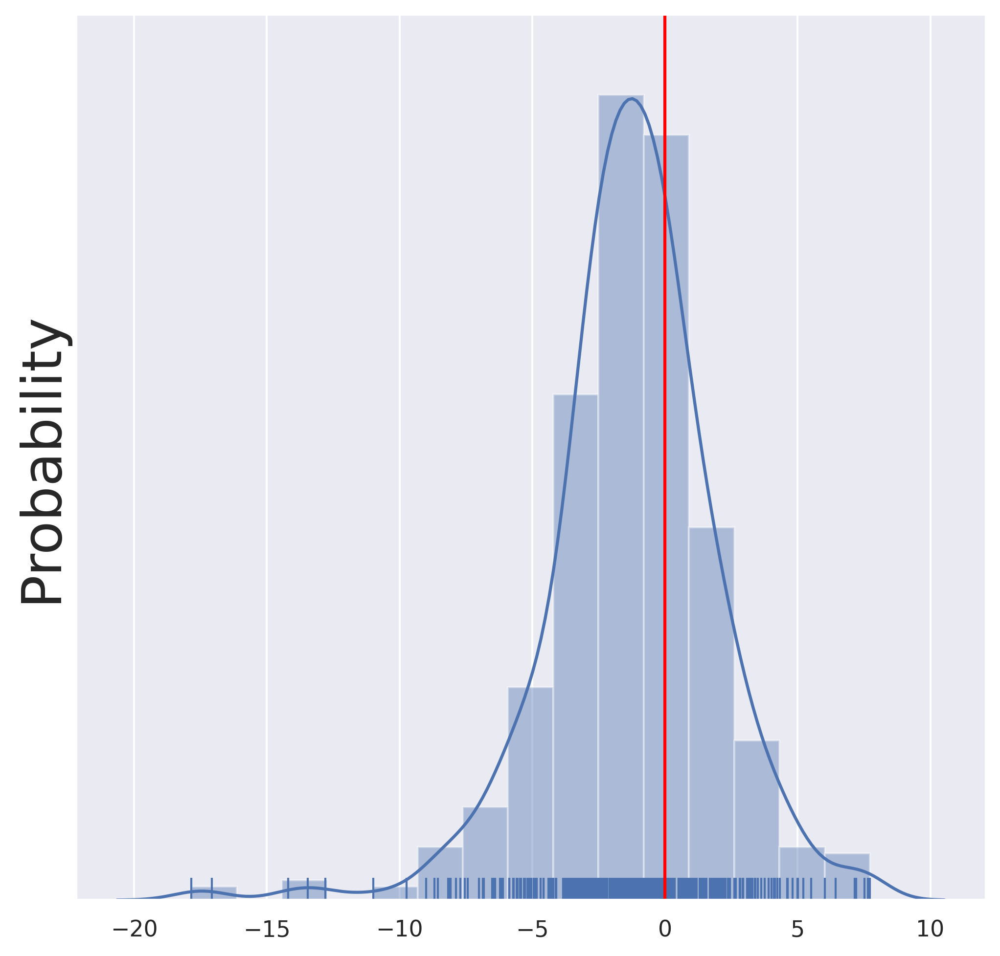

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

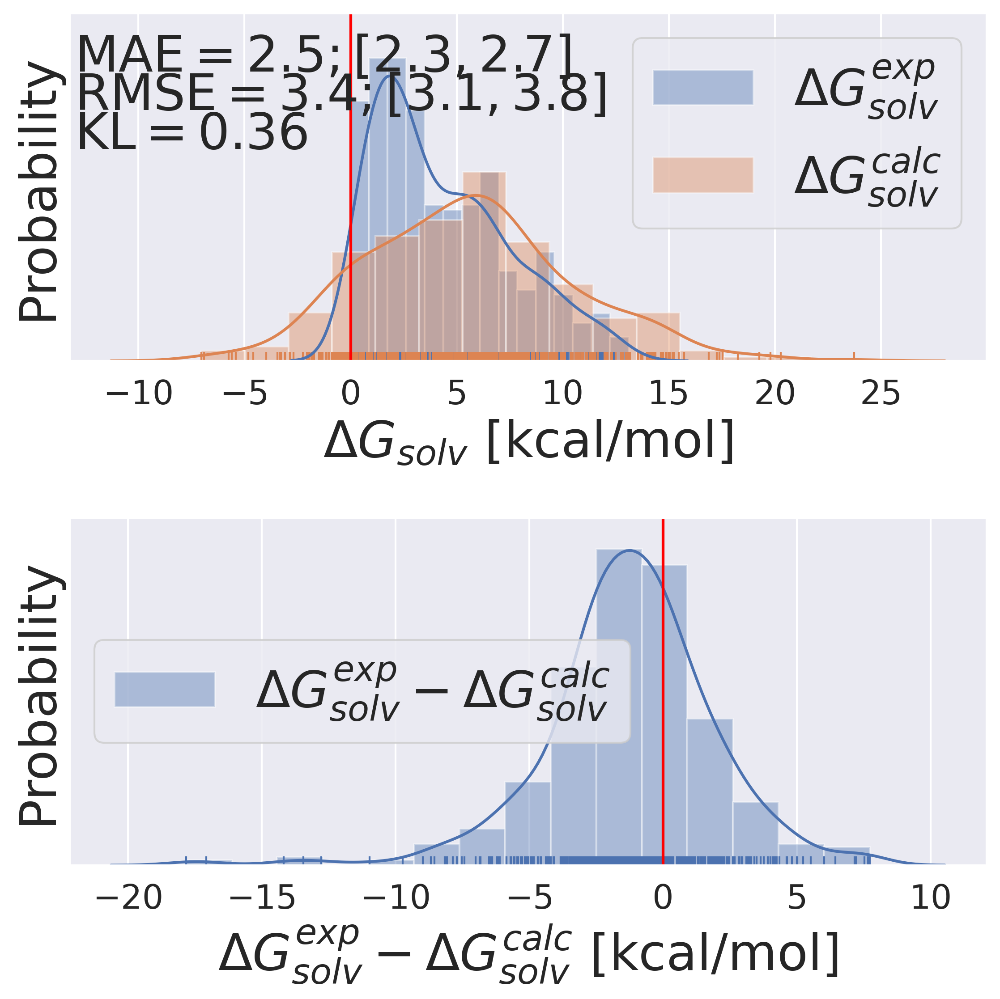

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


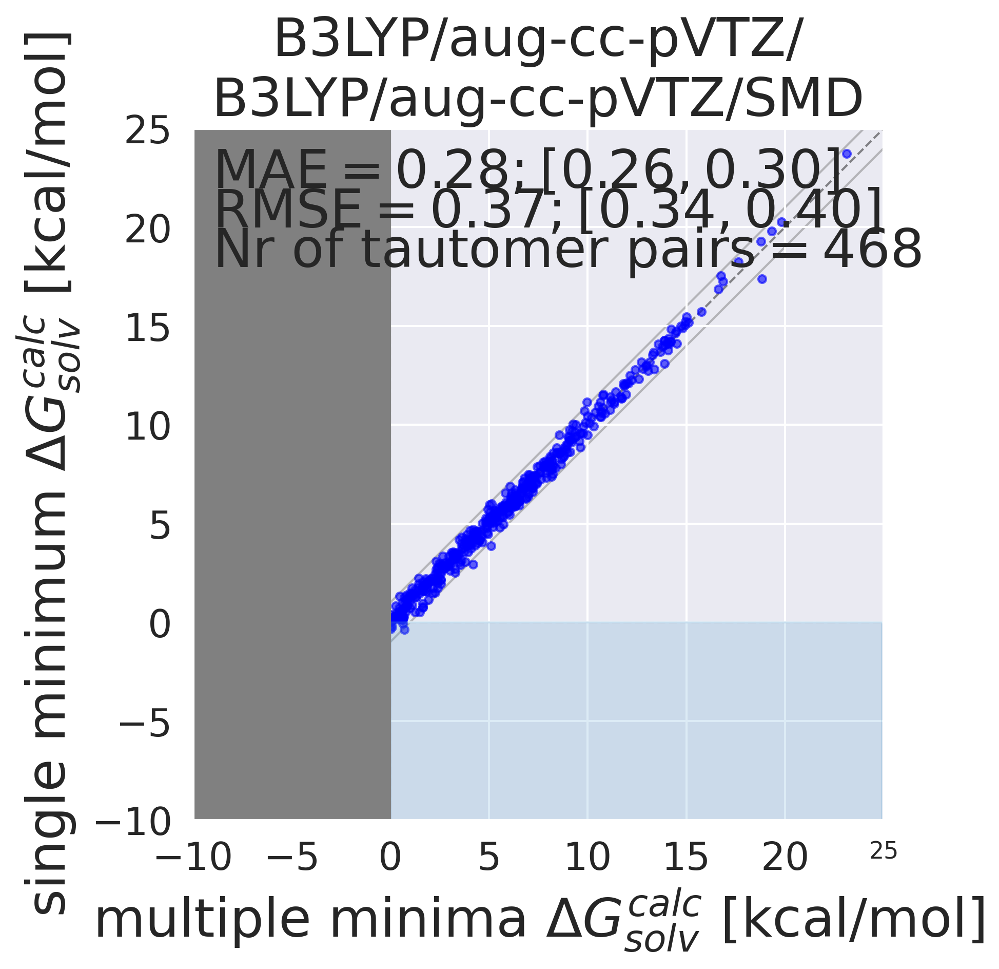

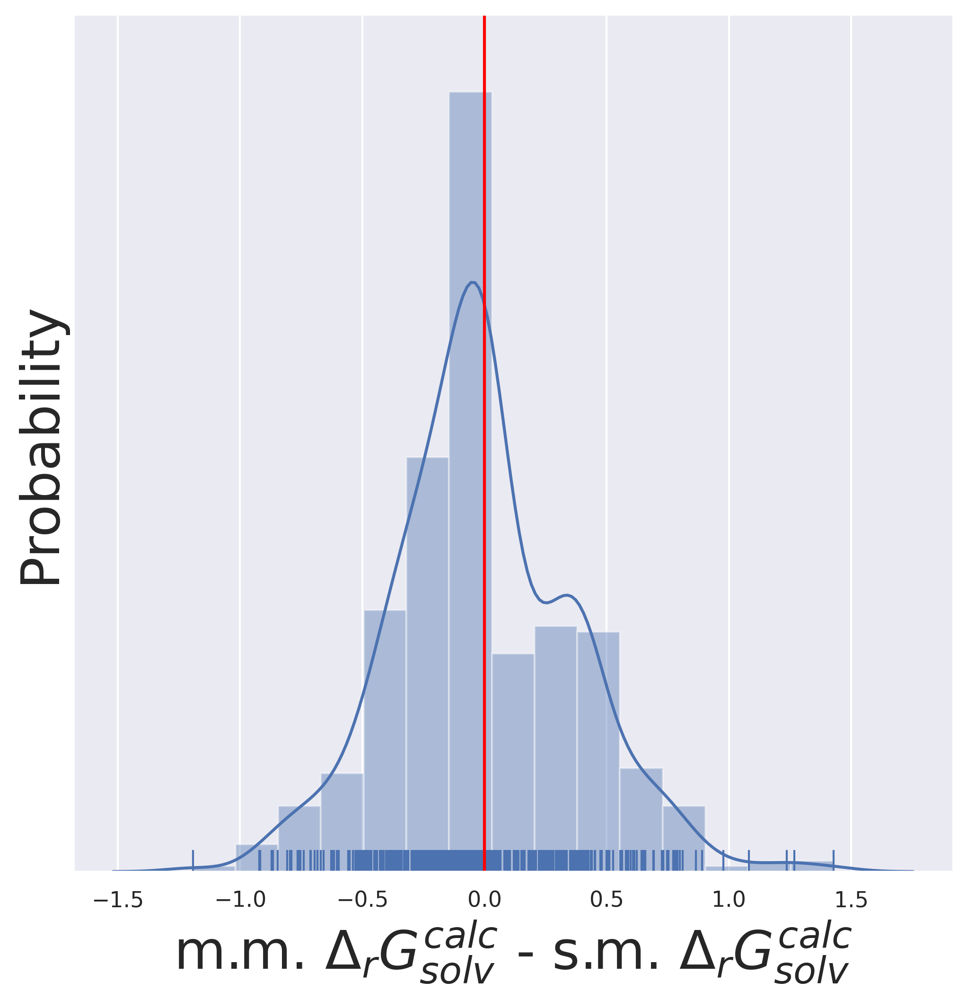

molDWRow_581
molDWRow_582
molDWRow_617
molDWRow_618
molDWRow_83
molDWRow_952
molDWRow_988
molDWRow_989


[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


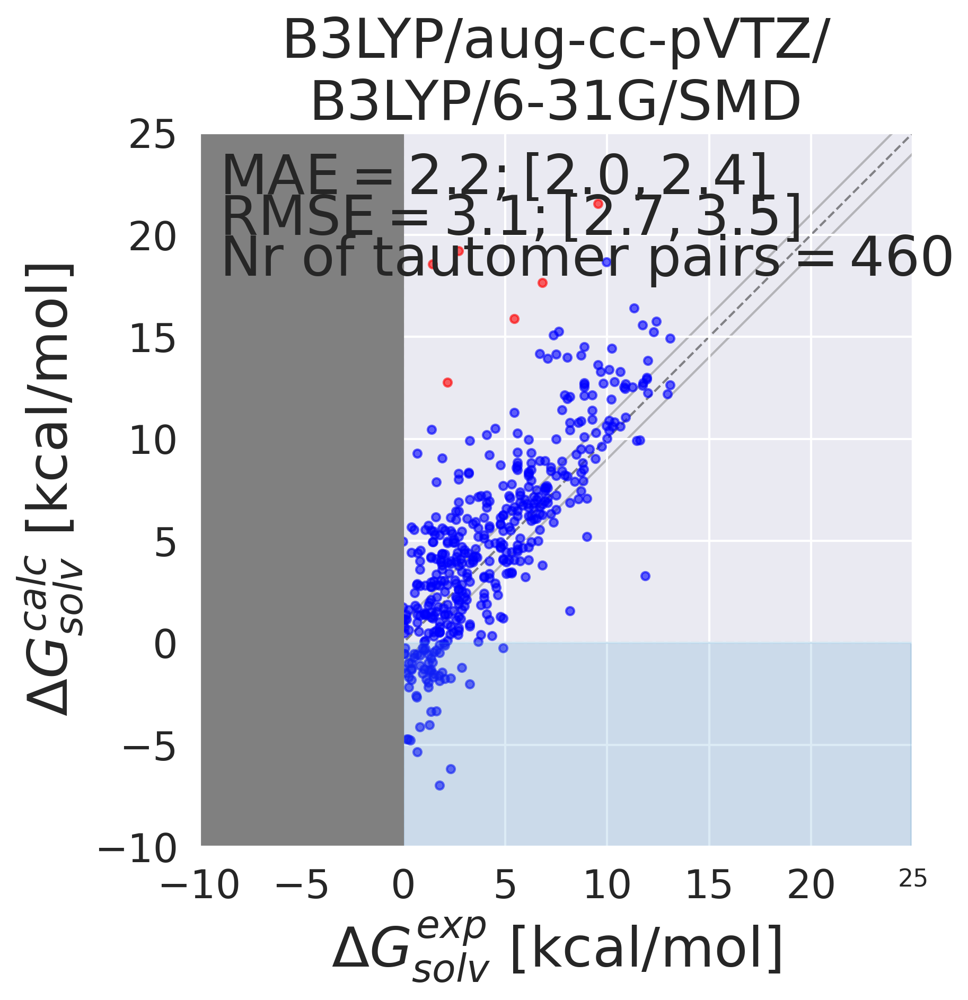

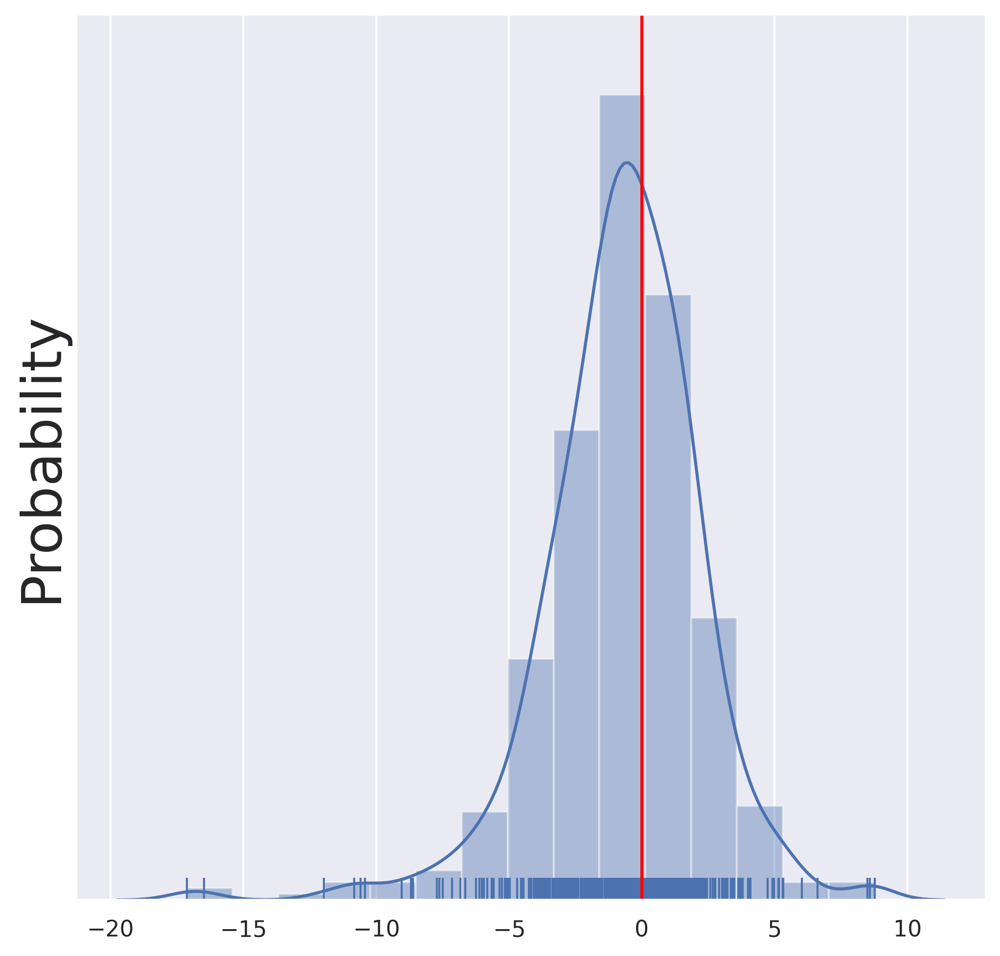

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

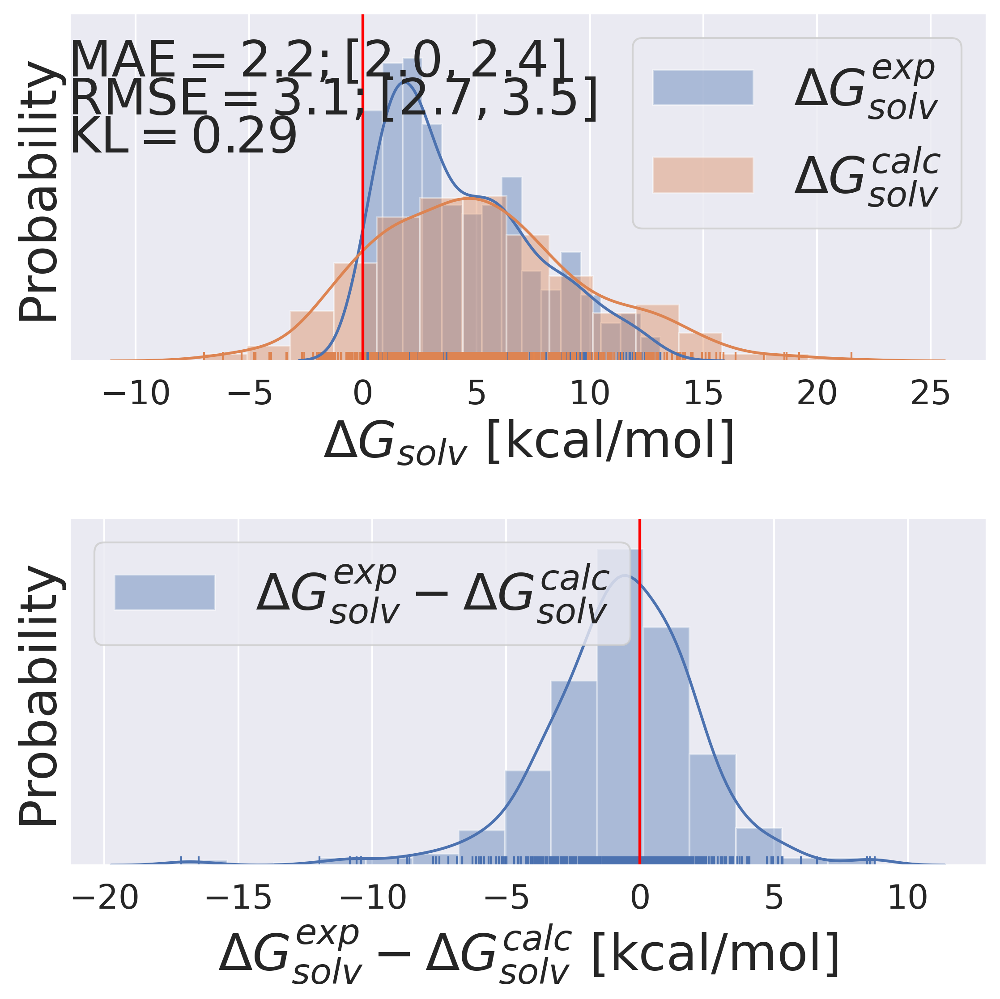

molDWRow_581
molDWRow_582
molDWRow_617
molDWRow_618
molDWRow_83
molDWRow_952
molDWRow_988
molDWRow_989


[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


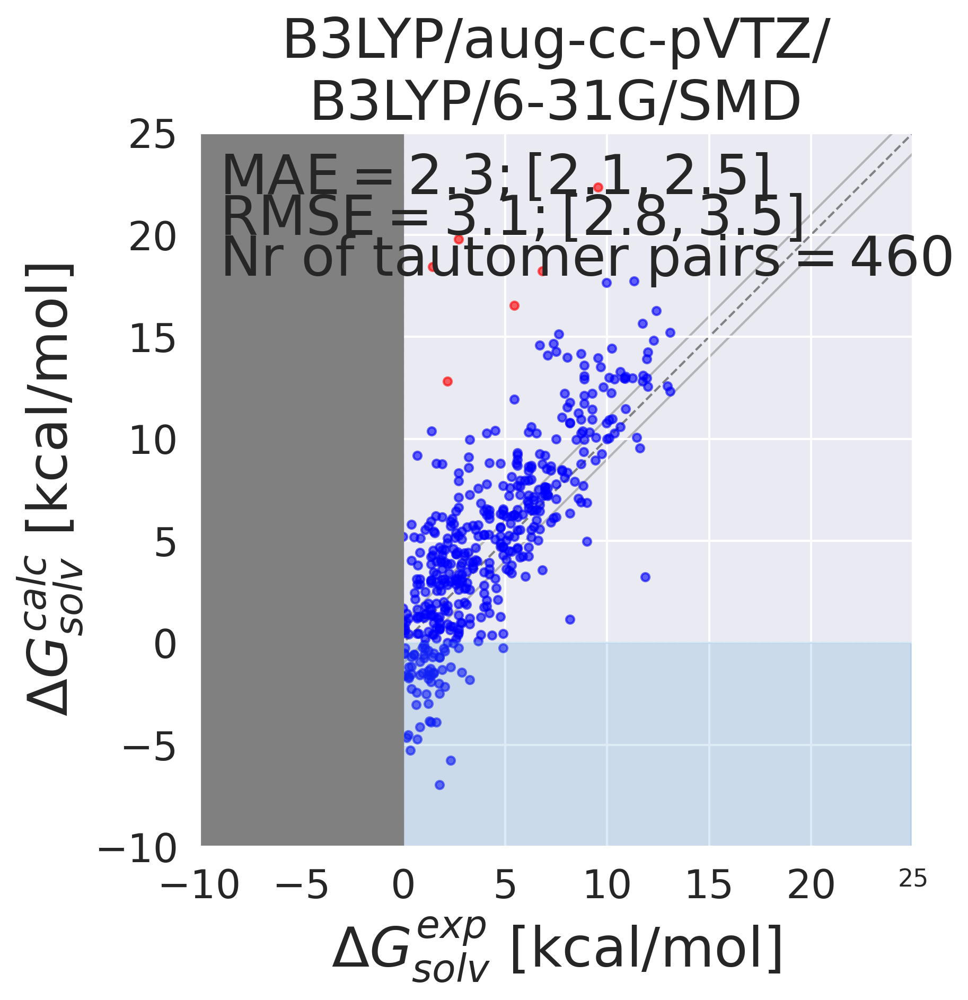

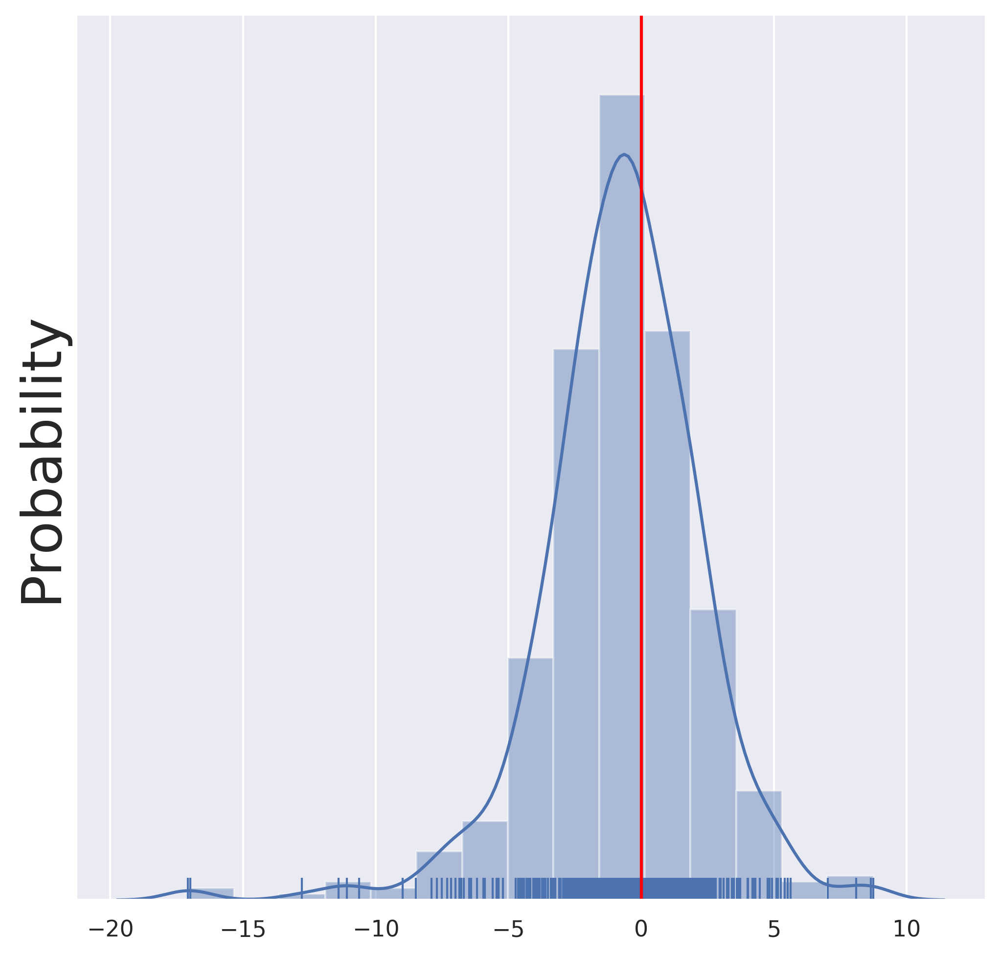

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

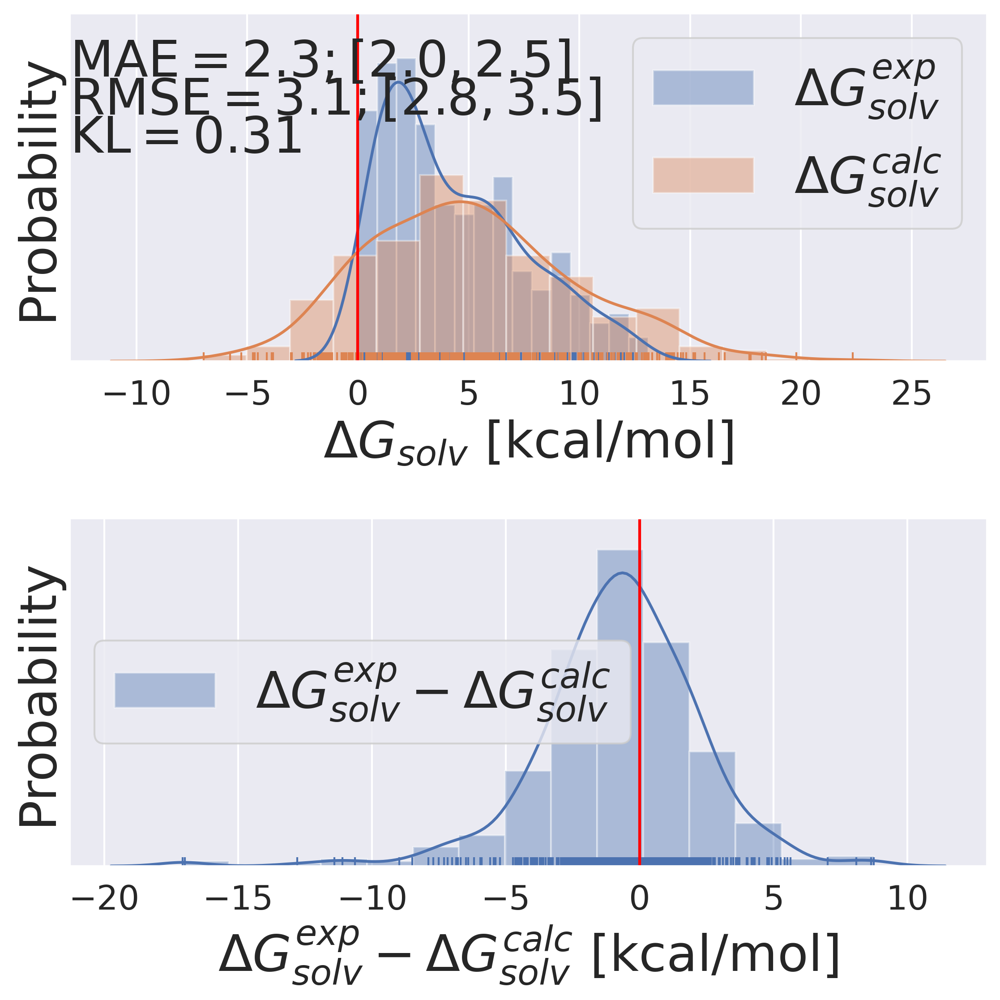

molDWRow_581
molDWRow_582
molDWRow_617
molDWRow_618
molDWRow_83
molDWRow_952
molDWRow_988
molDWRow_989


[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


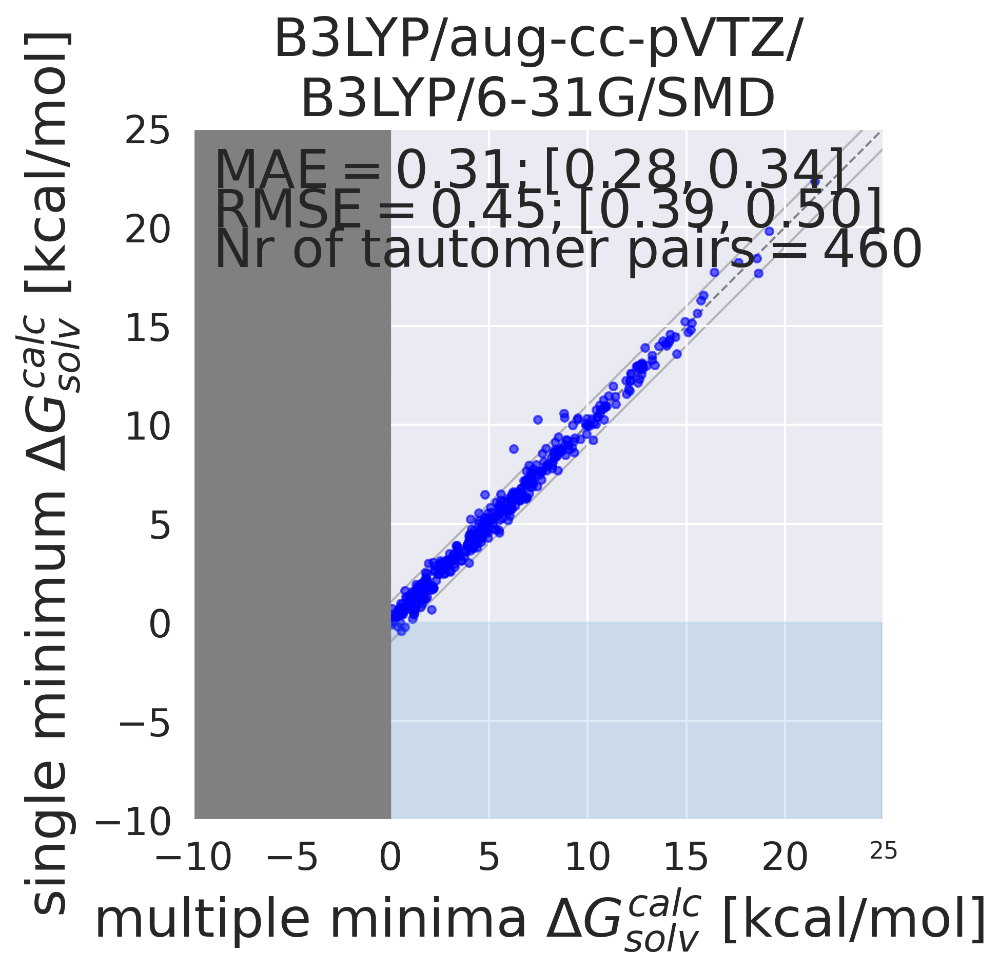

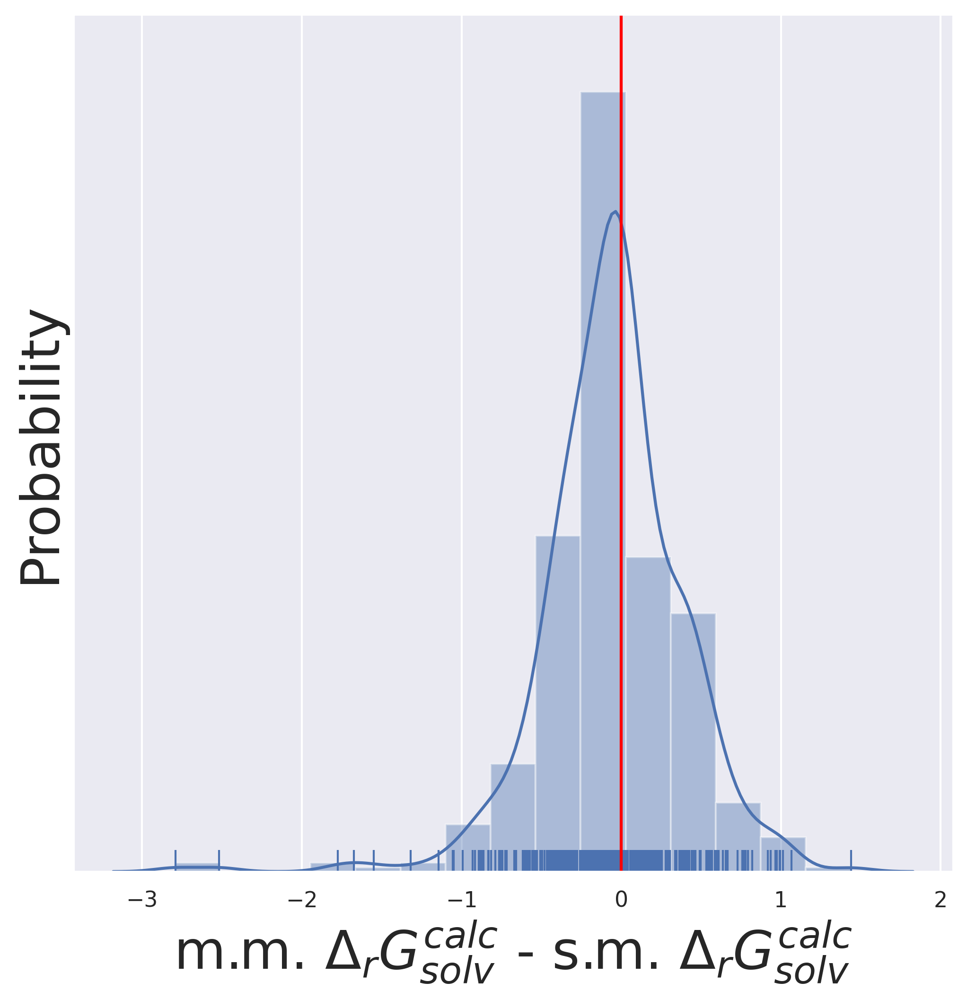

In [13]:
b3lyp_results = defaultdict(dict)

for name in sorted(qm_results.keys()):
    for t_name, smiles in zip(['t1', 't2'], qm_results[name]):
        
        vac_conf, solv_conf, m_vac, m_solv = combine_conformations(qm_results[name][smiles]['vac'], qm_results[name][smiles]['solv'])

        min_g = get_min_free_energy_in_solution_method1(m_solv)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method1-min"] = min_g
        mm = get_free_energy_in_solution_method1(solv_conf, m_solv)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method1-mm"], b3lyp_results[name][f"{t_name}-free-energy-solv-method1-minimas"]   = calculate_weighted_energy(mm), mm

        min_g = get_min_free_energy_in_solution_method2(m_vac, m_solv)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method2-min"]  = min_g
        mm = get_free_energy_in_solution_method2(vac_conf, m_vac, m_solv)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method2-mm"], b3lyp_results[name][f"{t_name}-free-energy-solv-method2-minimas"]   = calculate_weighted_energy(mm), mm

        min_g  = get_min_free_energy_in_solution_method3(m_vac, m_solv)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method3-min"] = min_g
        mm = get_free_energy_in_solution_method3(vac_conf, m_vac, m_solv)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method3-mm"], b3lyp_results[name][f"{t_name}-free-energy-solv-method3-minimas"]   = calculate_weighted_energy(mm), mm

plt.figure(figsize=[8, 8], dpi=300)


naming = {
    'method1': {
        'title' : 'B3LYP/aug-cc-pVTZ/SMD',
        'x-axis' : '$\Delta G_{solv}^{exp}$ [kcal/mol]',
        'y-axis' : '$\Delta G_{solv}^{calc}$ [kcal/mol]',

    },
    'method2': {
        'title' : 'B3LYP/aug-cc-pVTZ/\nB3LYP/aug-cc-pVTZ/SMD',
        'x-axis' : '$\Delta G_{solv}^{exp}$ [kcal/mol]',
        'y-axis' : '$\Delta G_{solv}^{calc}$ [kcal/mol]',

    },
    'method3': {
        'title' : 'B3LYP/aug-cc-pVTZ/\nB3LYP/6-31G/SMD',
        'x-axis' : '$\Delta G_{solv}^{exp}$ [kcal/mol]',
        'y-axis' : '$\Delta G_{solv}^{calc}$ [kcal/mol]',

    }
    
}


for method in ['method1','method2', 'method3']:
    for combining_method in ['mm', 'min']:
        
        
        x_list, y_list, names, error, outlier = combine_y_and_exp(method, combining_method)
        f = plot_correlation_analysis(names, x_list, y_list, naming[method]['title'], naming[method]['x-axis'], naming[method]['y-axis'], fontsize=25, mark_point_by_name=outlier)
        plot_single_dist(x_list, y_list, label='')
        plot_diff(x_list, y_list)
    x_list, y_list, names, error = combine_x_and_y(method)
    f = plot_correlation_analysis(names, x_list, y_list, naming[method]['title'], f"multiple minima {naming[method]['y-axis']}" , f"single minimum {naming[method]['y-axis']}", fontsize=25)
    plot_single_dist(x_list, y_list, label='m.m. $\Delta_{r}G_{solv}^{calc}$ - s.m. $\Delta_{r}G_{solv}^{calc}$')

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or 

<Figure size 2400x2400 with 0 Axes>

<Figure size 2400x2400 with 0 Axes>

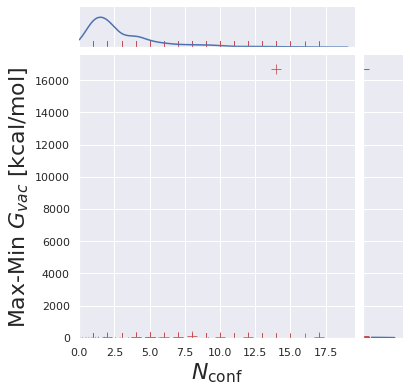

<Figure size 2400x2400 with 0 Axes>

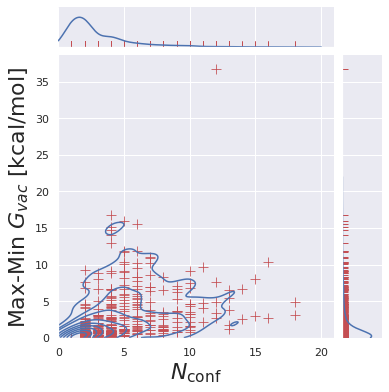

<Figure size 2400x2400 with 0 Axes>

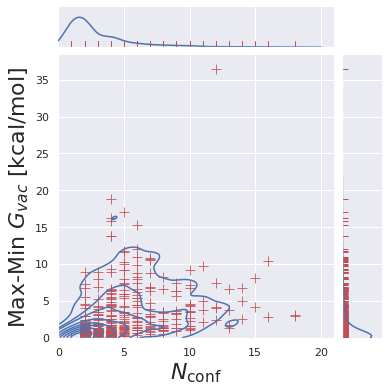

In [14]:
plt.figure(figsize=[8, 8], dpi=300)

for method in ['method1', 'method2', 'method3']:

    nr_of_min = []
    max_min = []
    names_t = []
    outliers_names = []
    for name in sorted(qm_results.keys()):

        mm1 = b3lyp_results[name][f"t1-free-energy-solv-{method}-minimas"]
        mm2 = b3lyp_results[name][f"t2-free-energy-solv-{method}-minimas"]
        nr_of_min.append(len(mm1))
        nr_of_min.append(len(mm2))


        t1_max_min = (max(mm1)-min(mm1)).value_in_unit(unit.kilocalorie_per_mole)
        t2_max_min = (max(mm2)-min(mm2)).value_in_unit(unit.kilocalorie_per_mole)

        max_min.append(t1_max_min)   
        max_min.append(t2_max_min)

        names_t.append((name, 't1'))
        names_t.append((name, 't2'))

        if t1_max_min > 10.0:
            outliers_names.append((name, 't1'))

        if t2_max_min > 10.0:
            outliers_names.append((name, 't2'))

    plt.figure(figsize=[8, 8], dpi=300)
    df = pd.DataFrame(zip(max_min, nr_of_min), columns =['Max-Min $G_{vac}$ [kcal/mol]', '$N_{\mathrm{conf}}$'])
    sns.set(rc={'figure.figsize':(8,8),"font.size":25,"axes.titlesize":25,"axes.labelsize":22})

    g = sns.jointplot("$N_{\mathrm{conf}}$", "Max-Min $G_{vac}$ [kcal/mol]", data=df, 
                     kind="kde",clip=(0, 20),marginal_kws={'clip':(0, 22)},
                      ratio=6)
    g.plot_joint(sns.scatterplot, color="r", marker="+", s=100)
    g.plot_marginals(sns.rugplot, color="r", height=.15, clip_on=True)#height=-.15, clip_on=True)
    from  matplotlib.ticker import FuncFormatter
    plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: int(x)))
    g

In [ ]:
# Now everything with added symmetry correction

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


<Figure size 2400x2400 with 0 Axes>

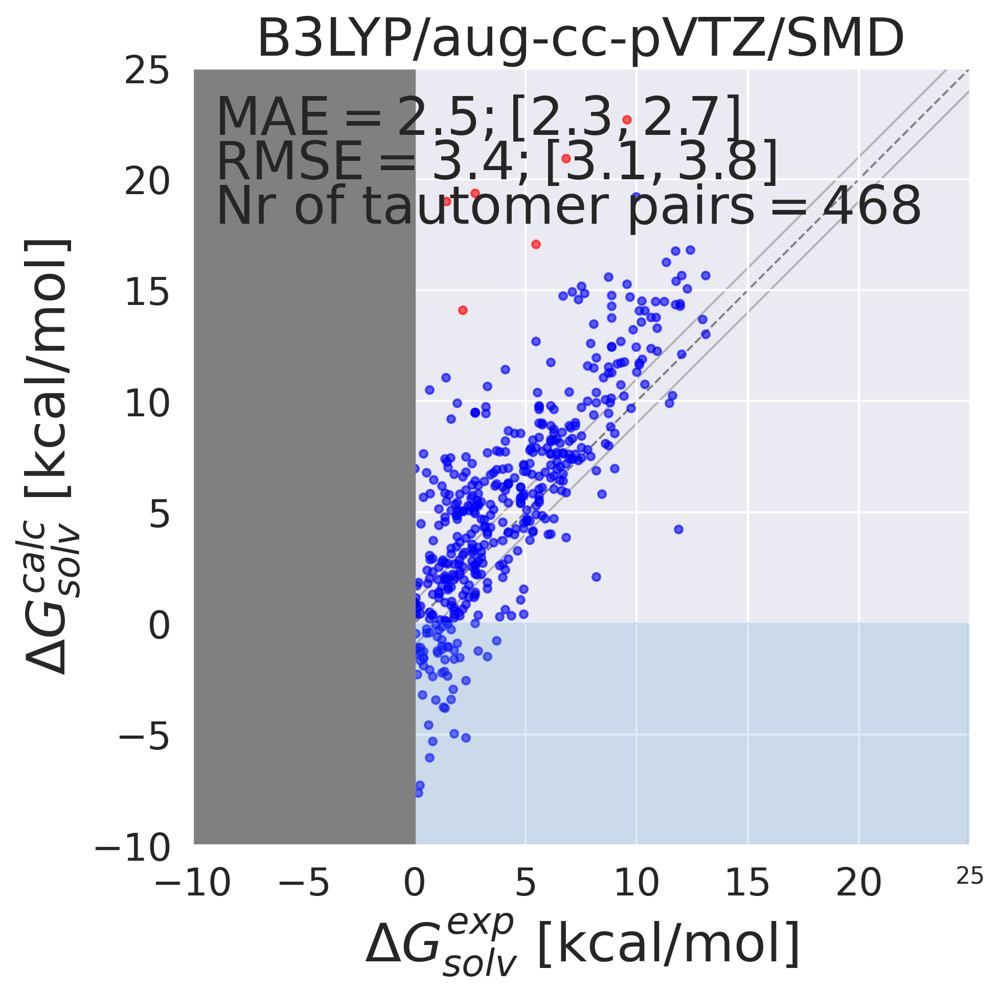

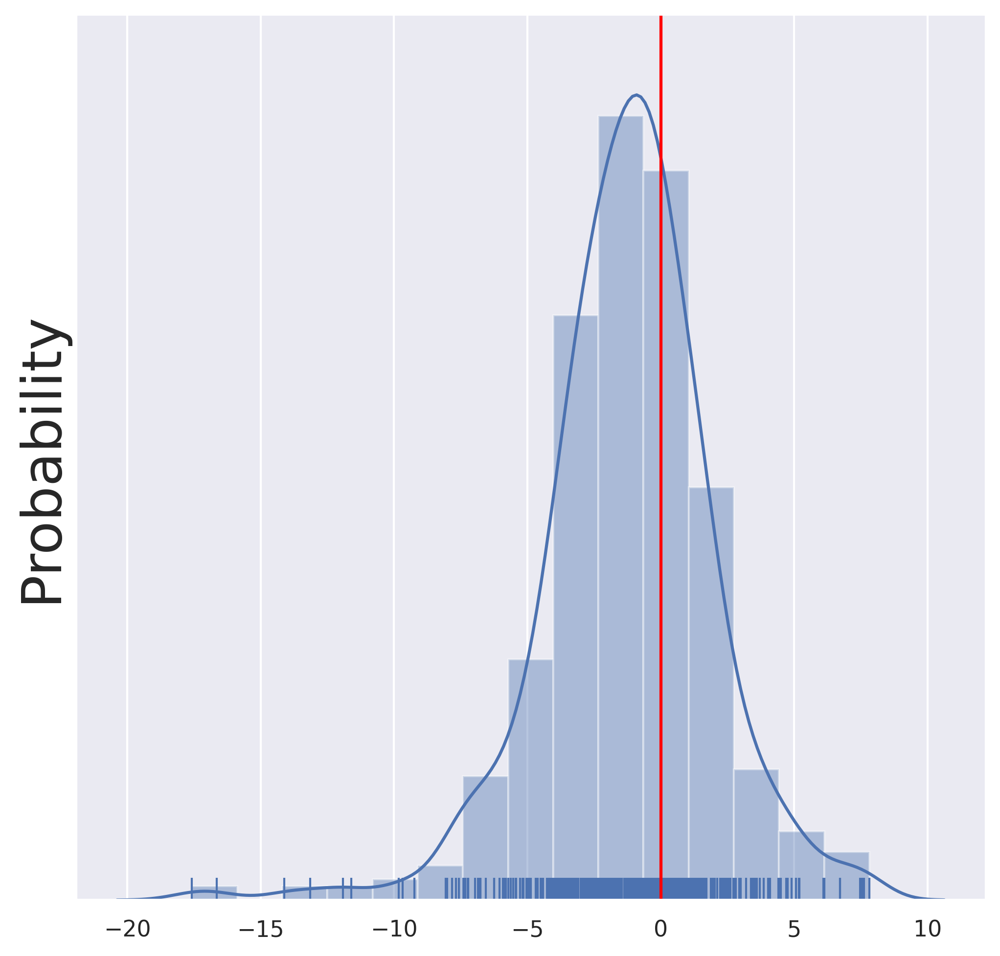

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

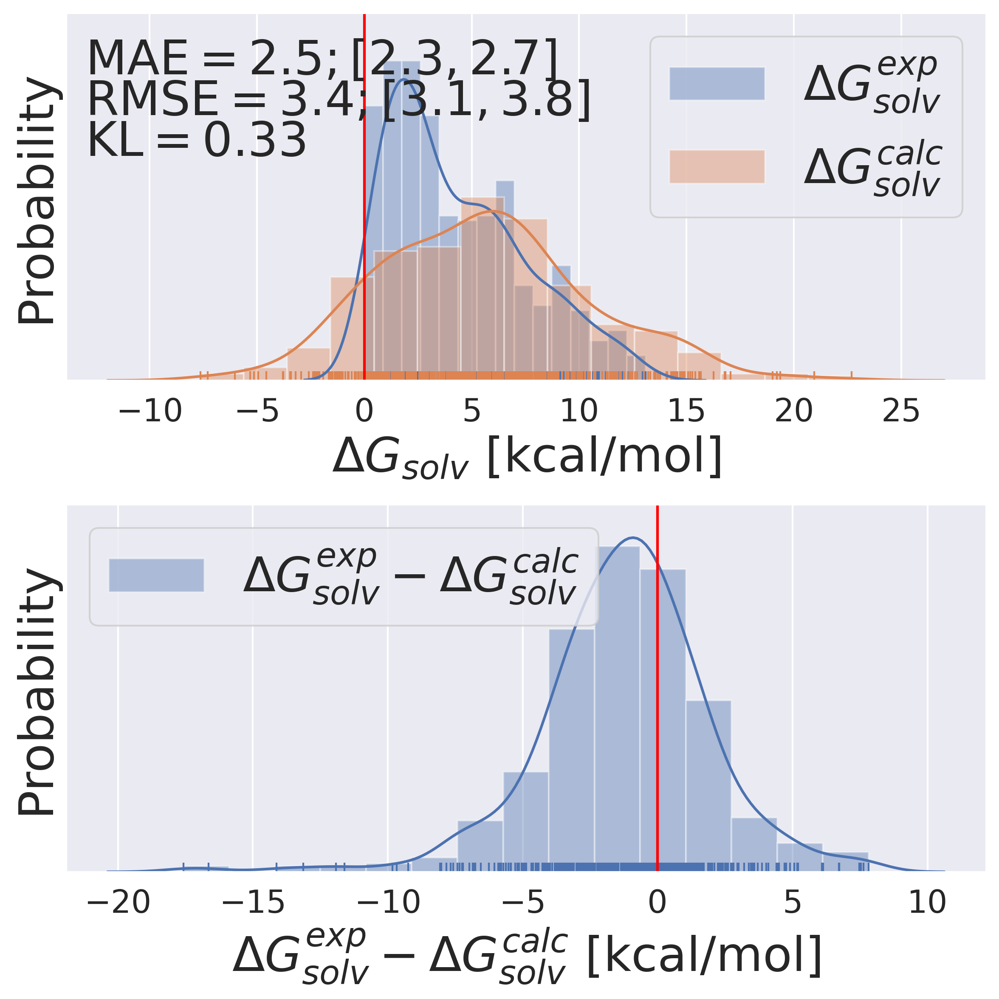

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


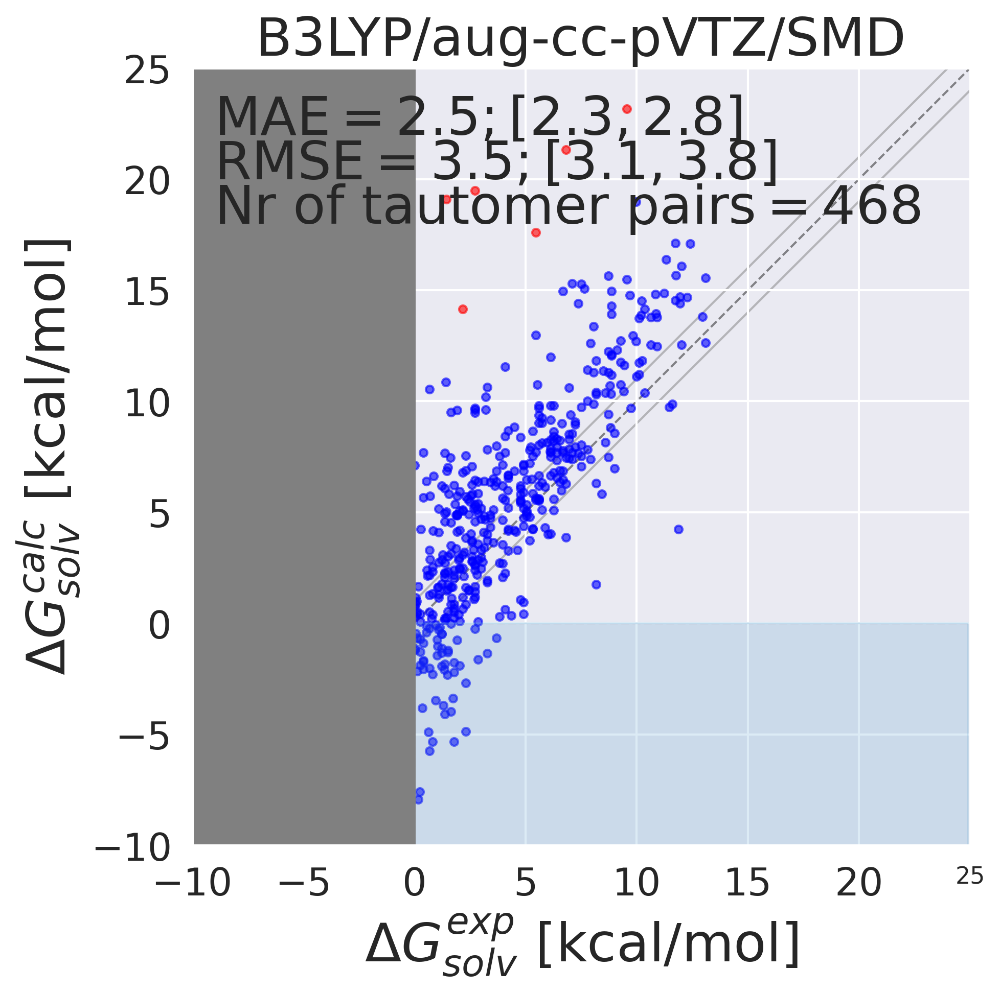

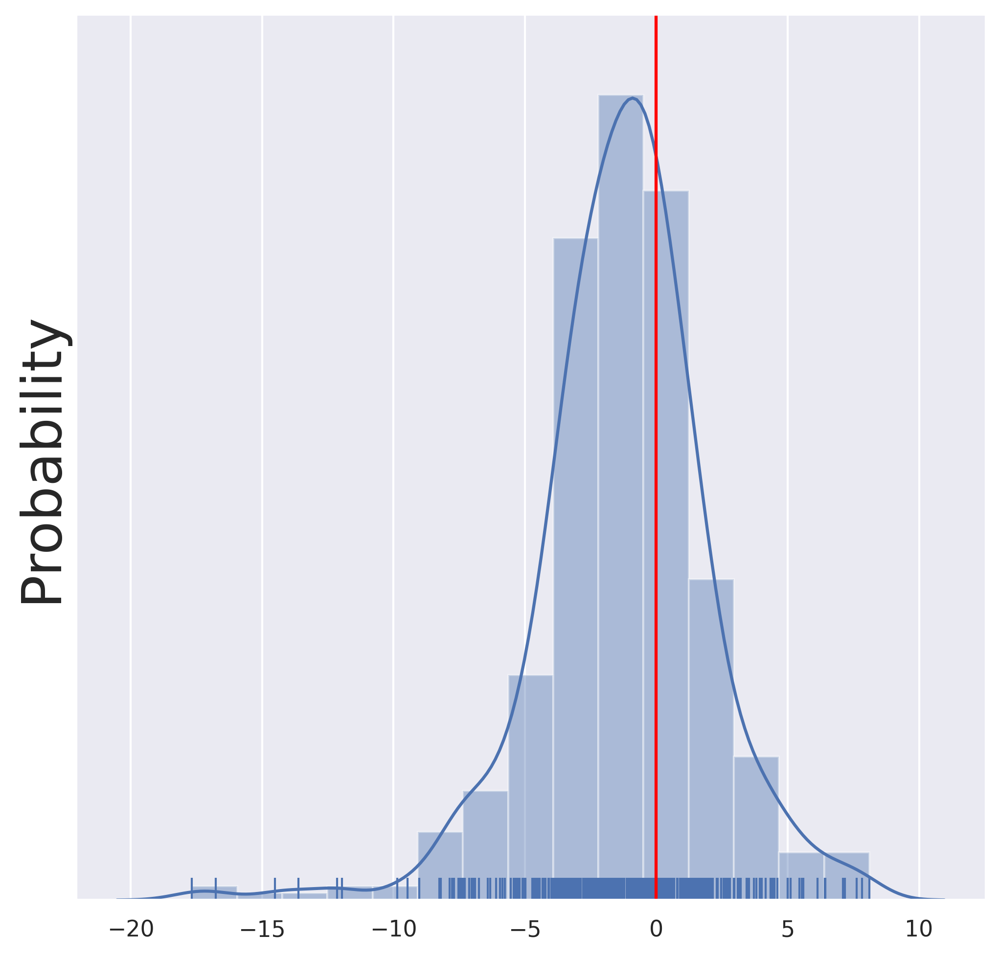

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

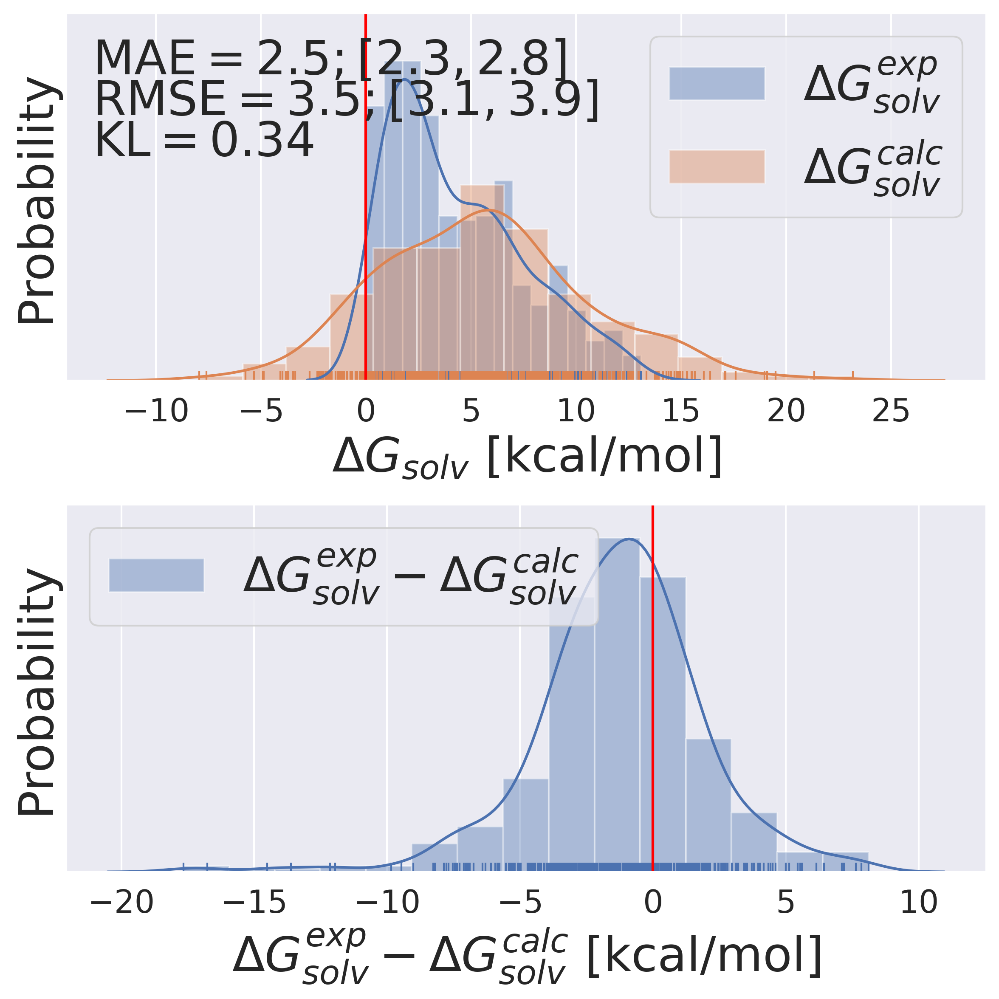

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


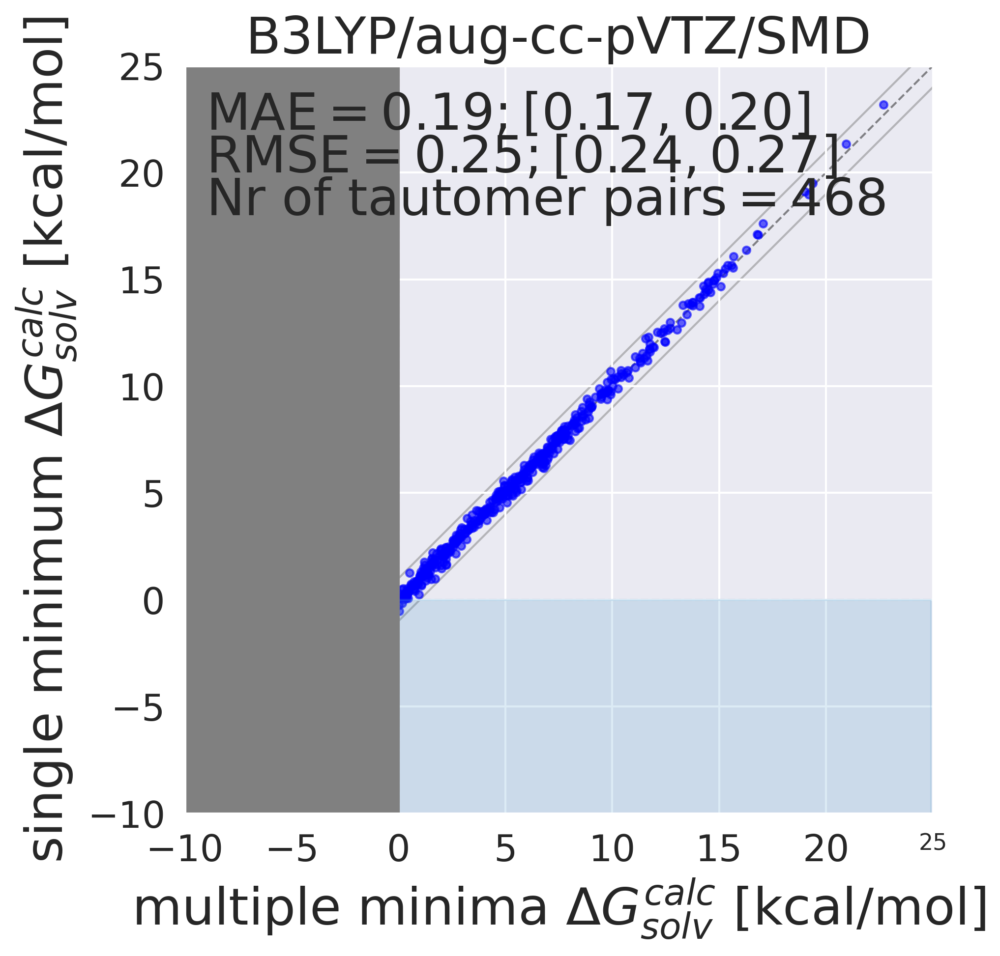

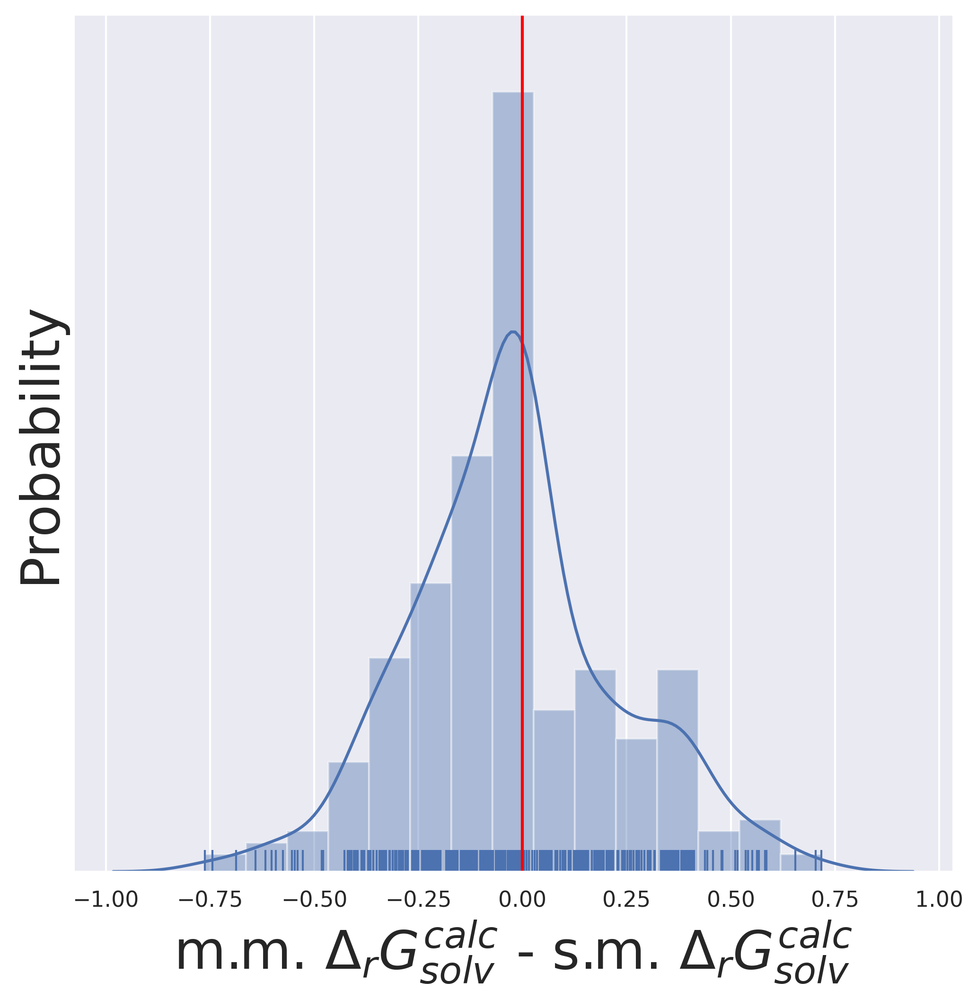

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


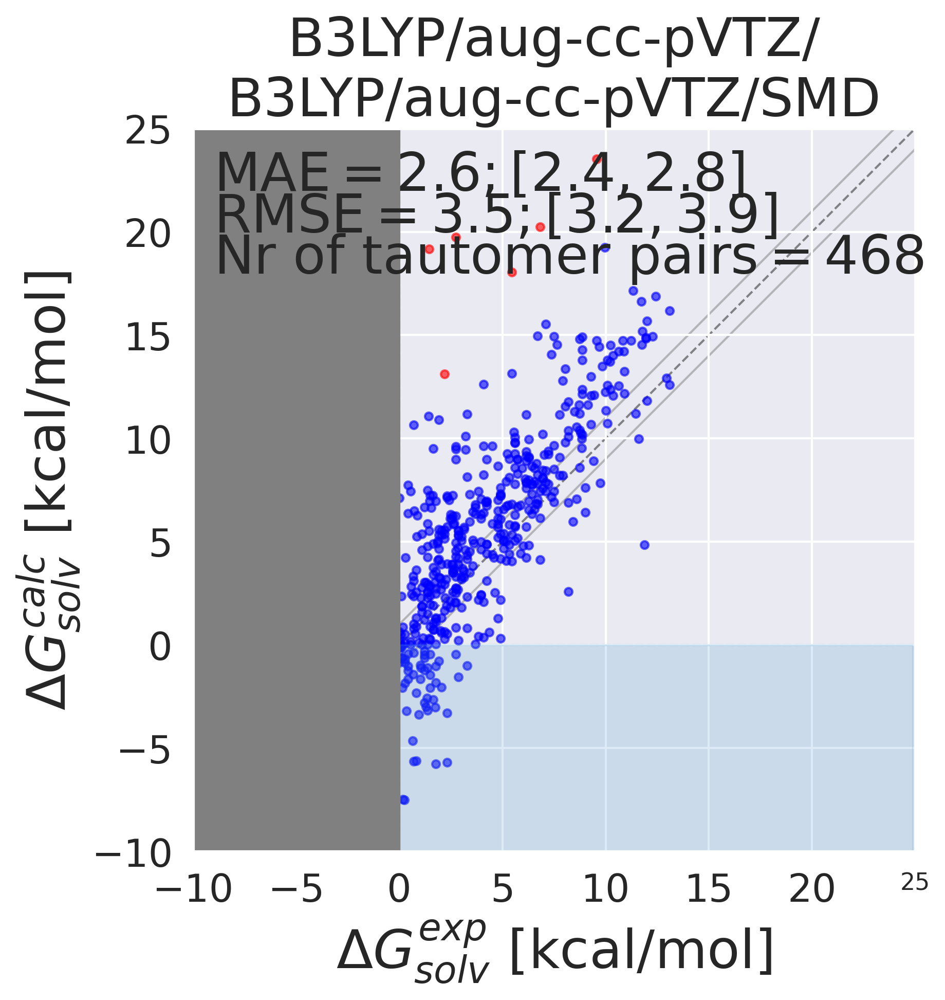

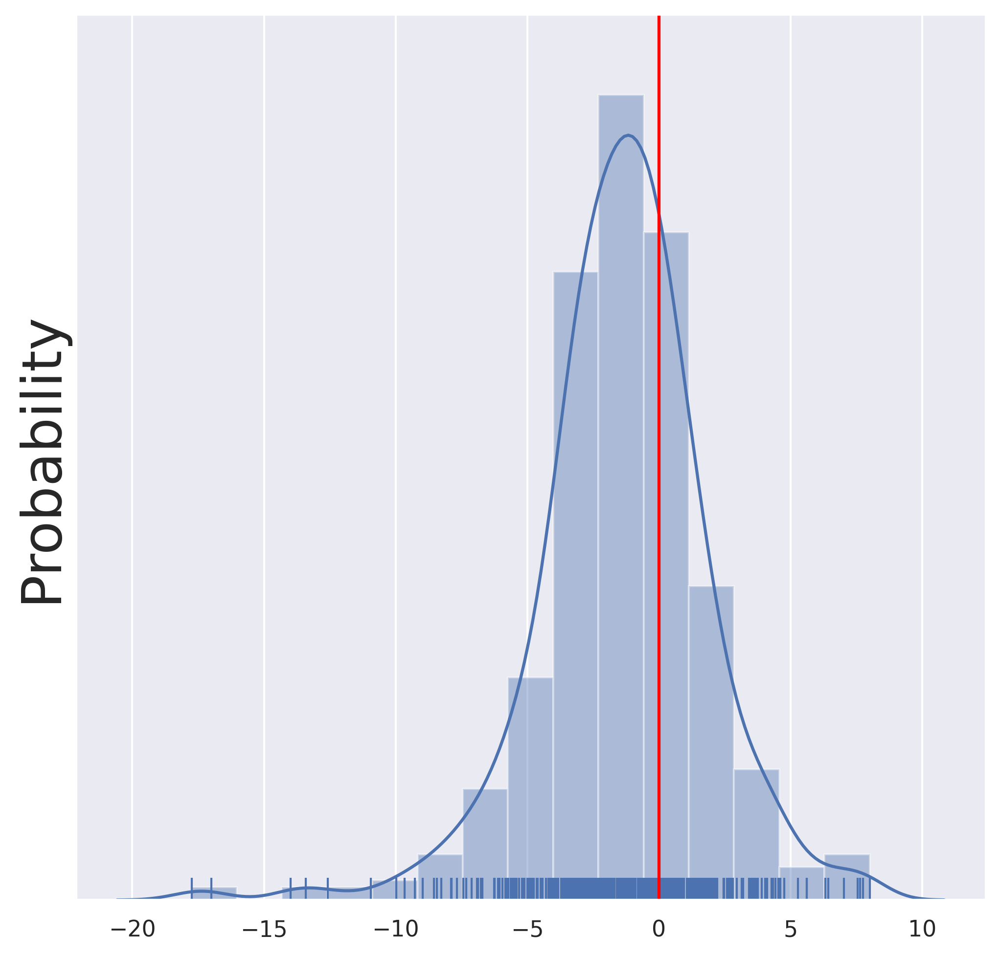

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

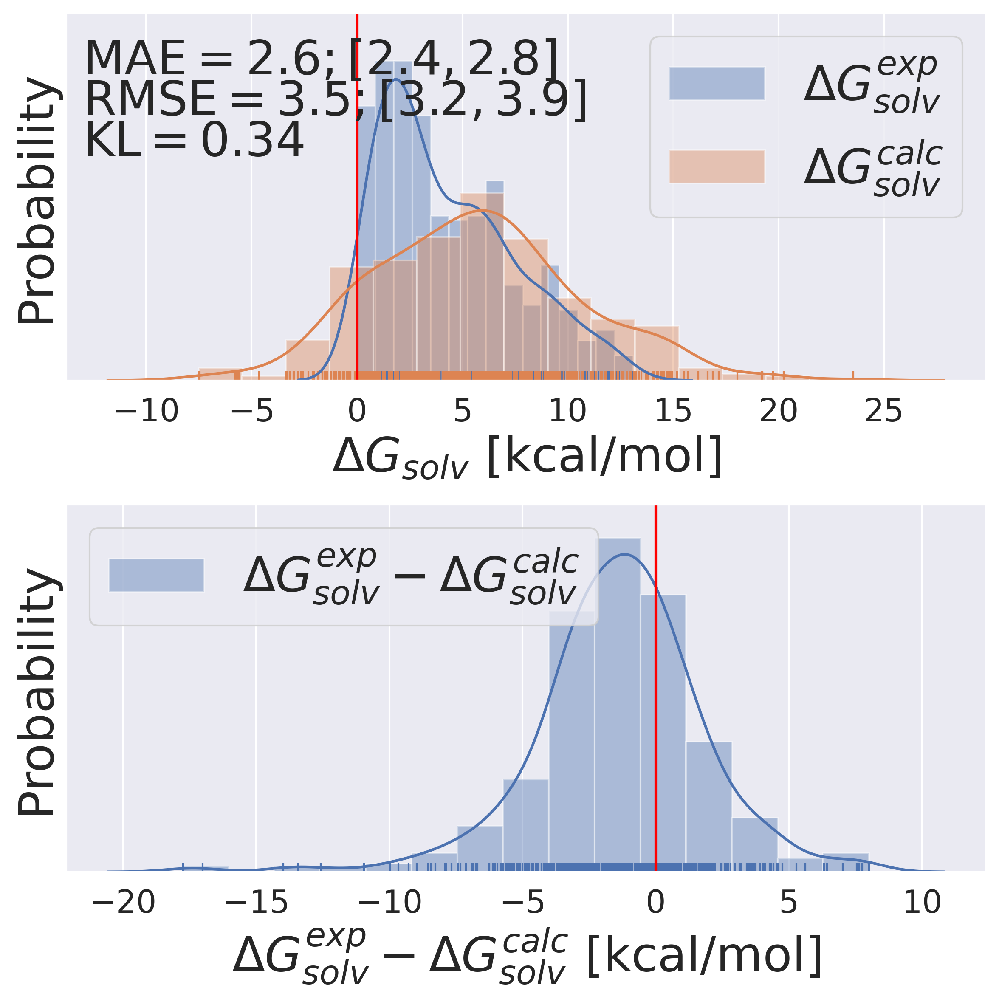

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


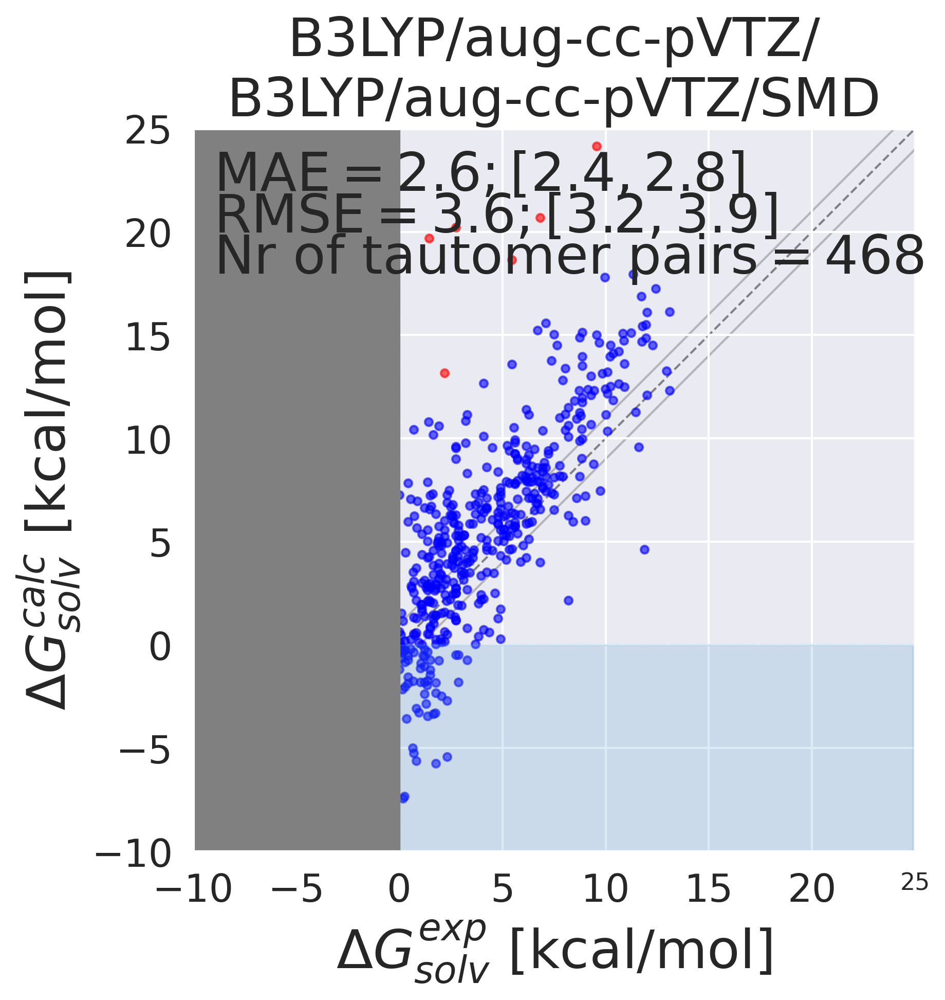

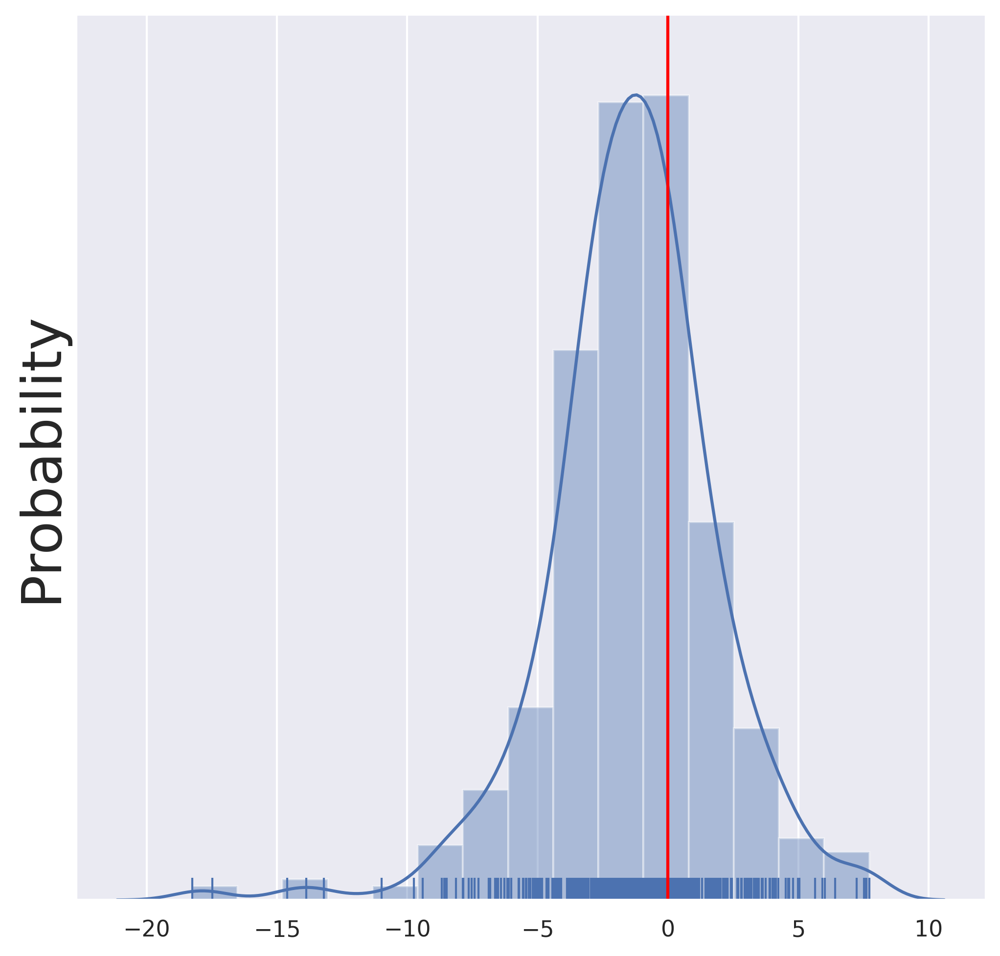

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

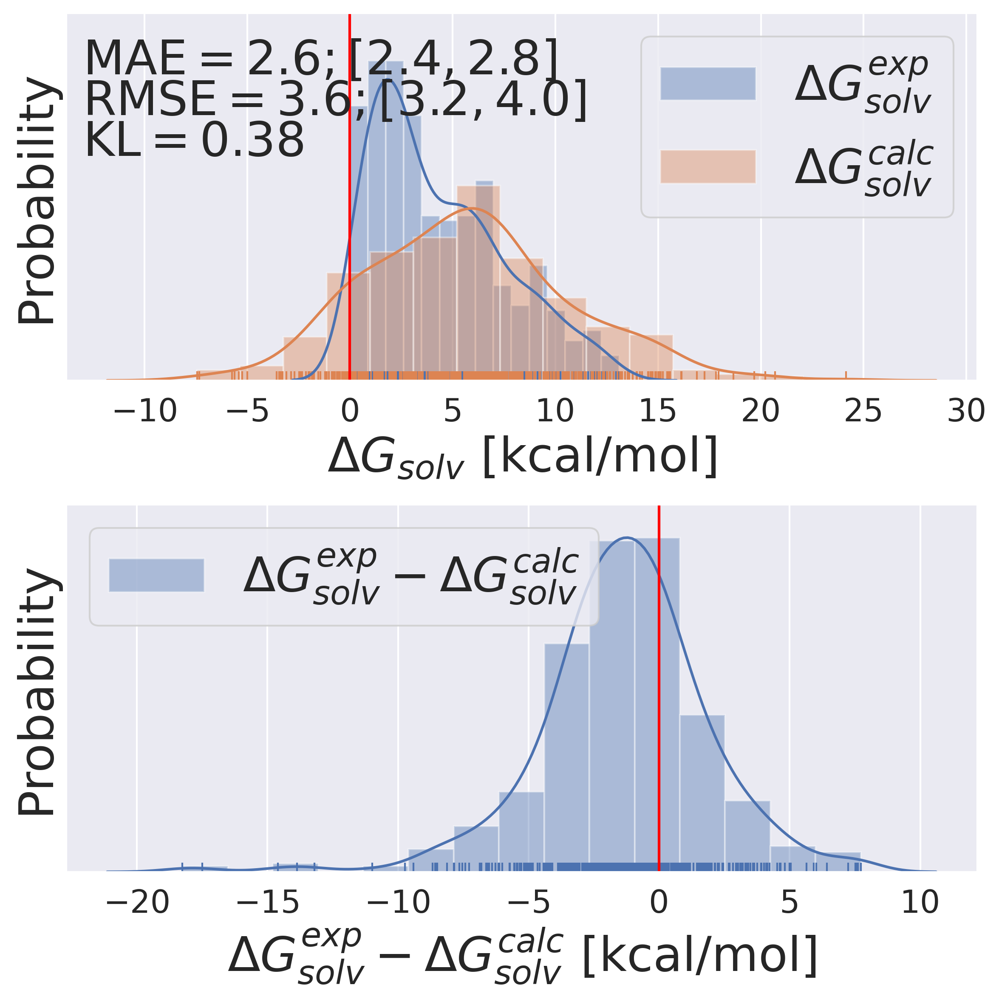

[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


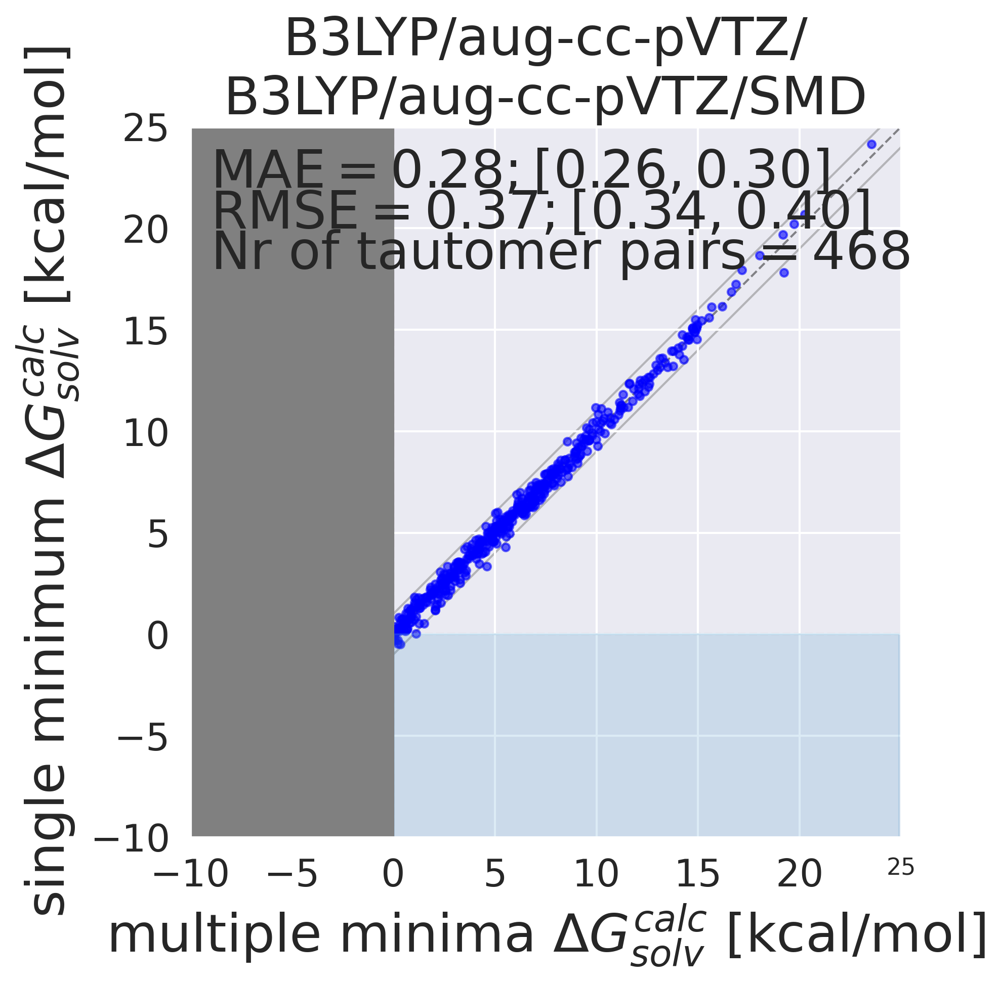

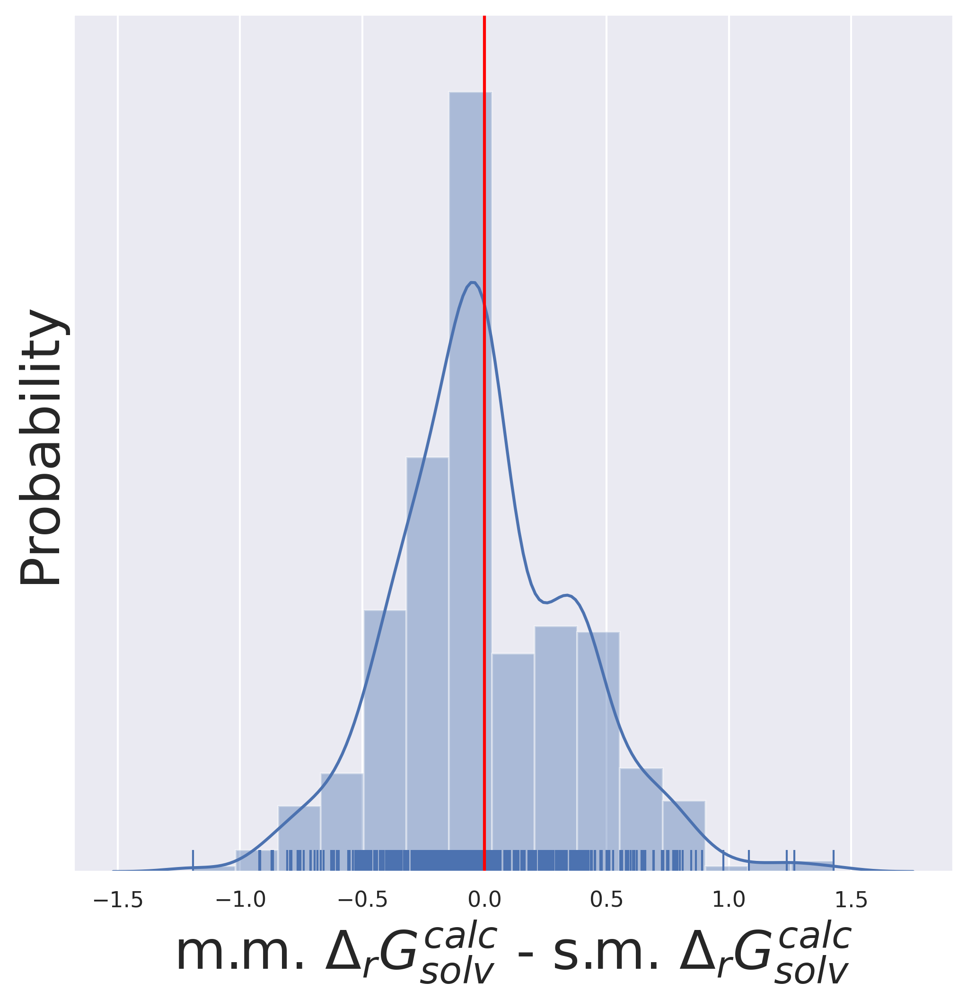

molDWRow_581
molDWRow_582
molDWRow_617
molDWRow_618
molDWRow_83
molDWRow_952
molDWRow_988
molDWRow_989


[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


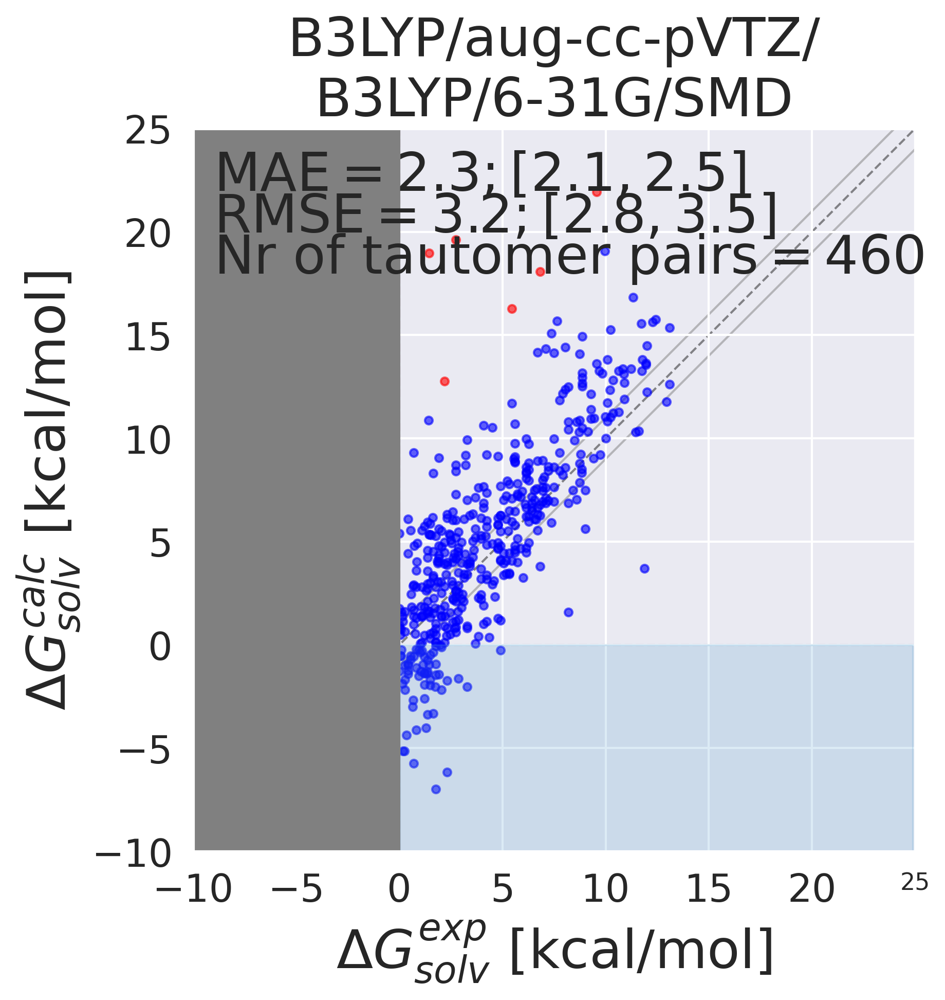

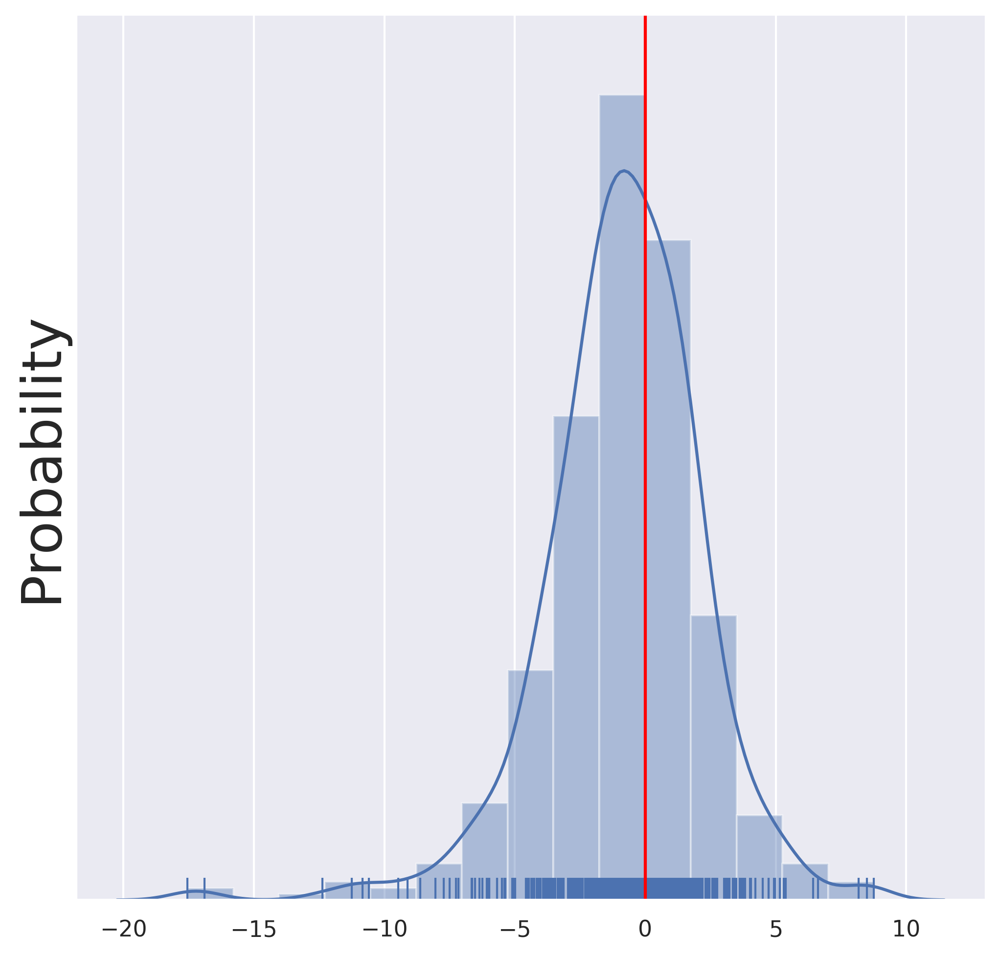

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

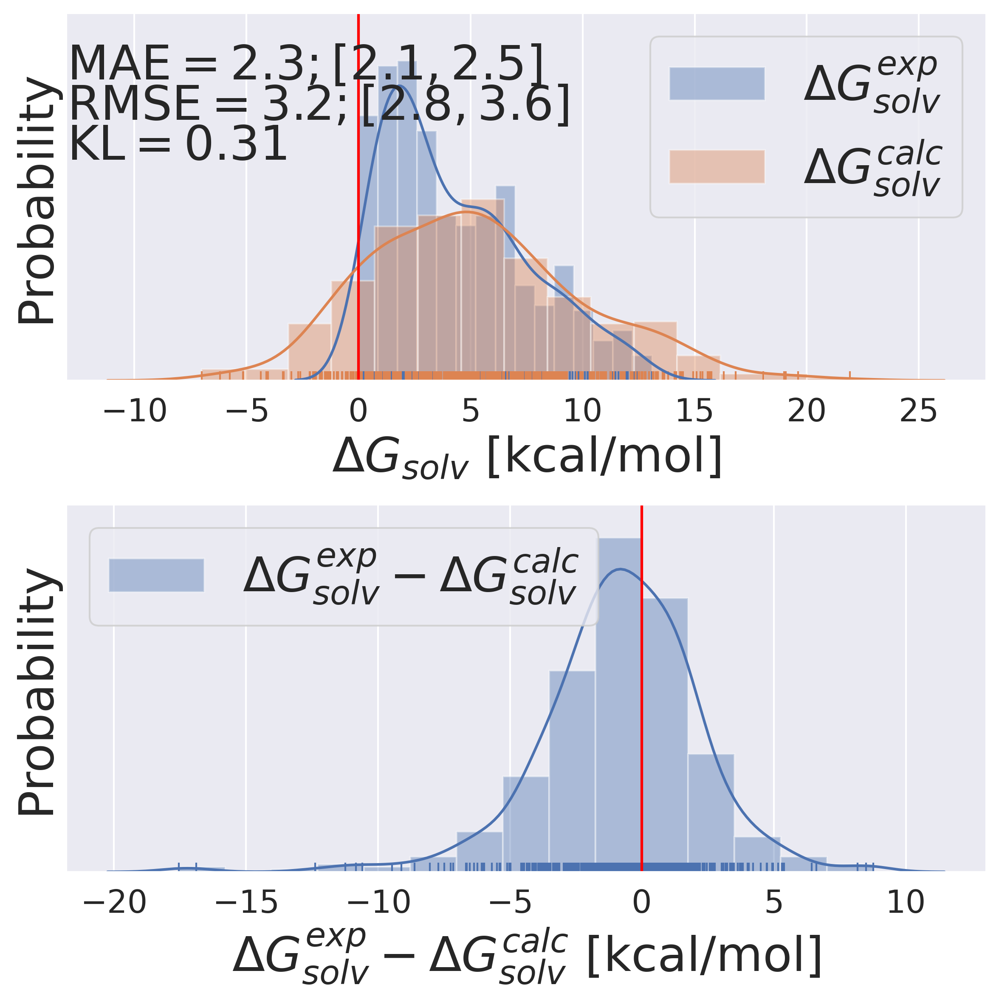

molDWRow_581
molDWRow_582
molDWRow_617
molDWRow_618
molDWRow_83
molDWRow_952
molDWRow_988
molDWRow_989


[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


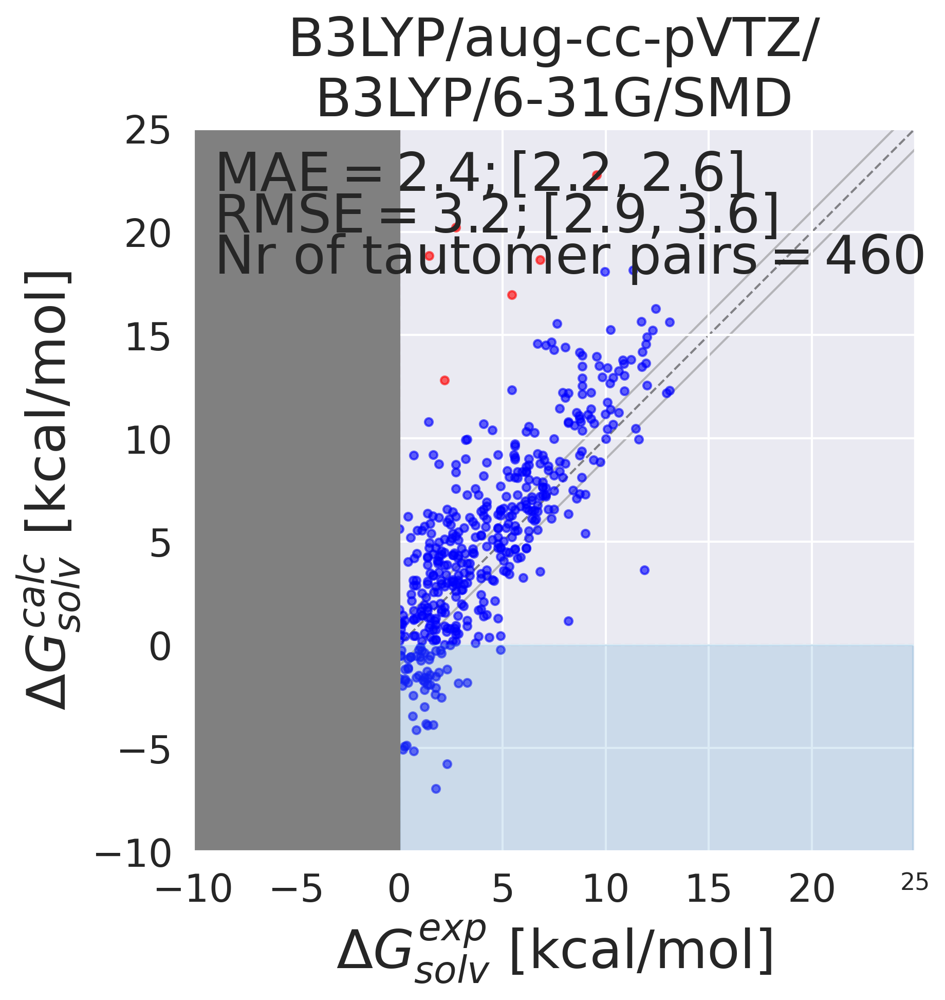

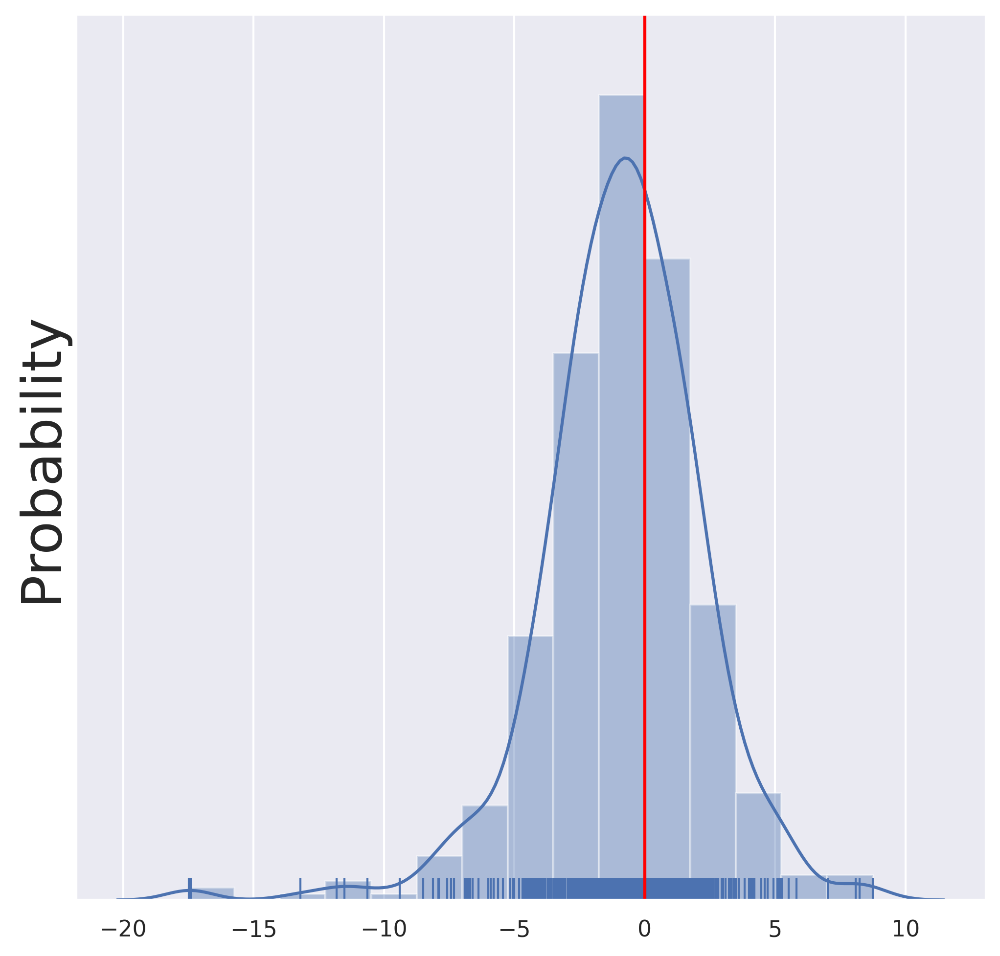

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarni

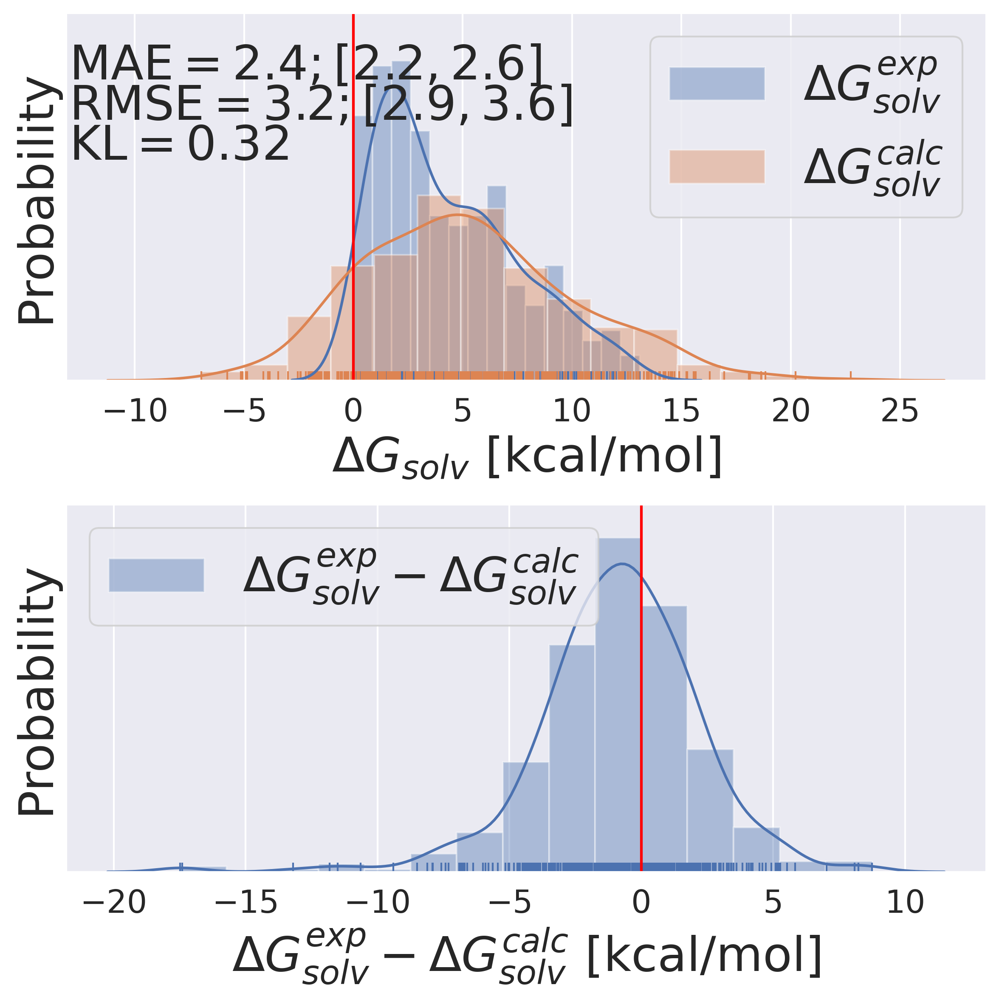

molDWRow_581
molDWRow_582
molDWRow_617
molDWRow_618
molDWRow_83
molDWRow_952
molDWRow_988
molDWRow_989


[plotting.py:54 - plot_correlation_analysis()] Plotting without y-error bars
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/distributions.py:2055: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


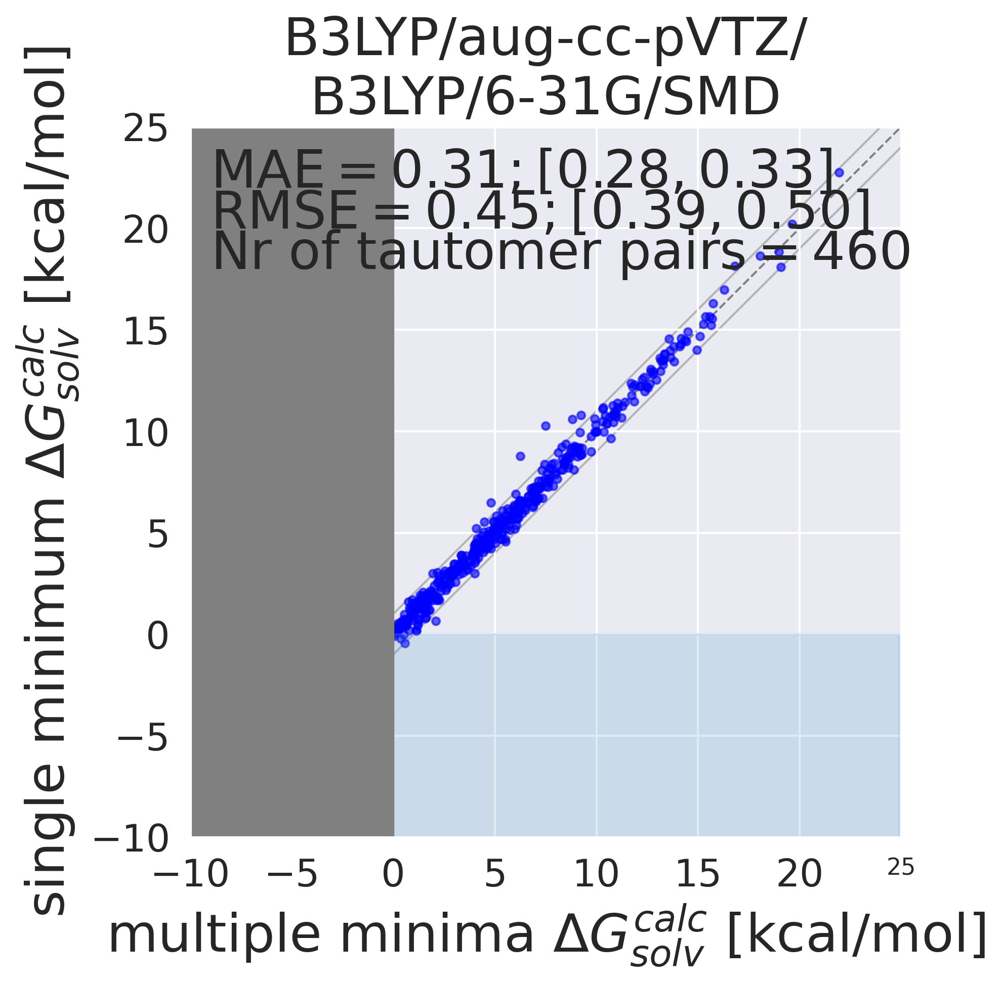

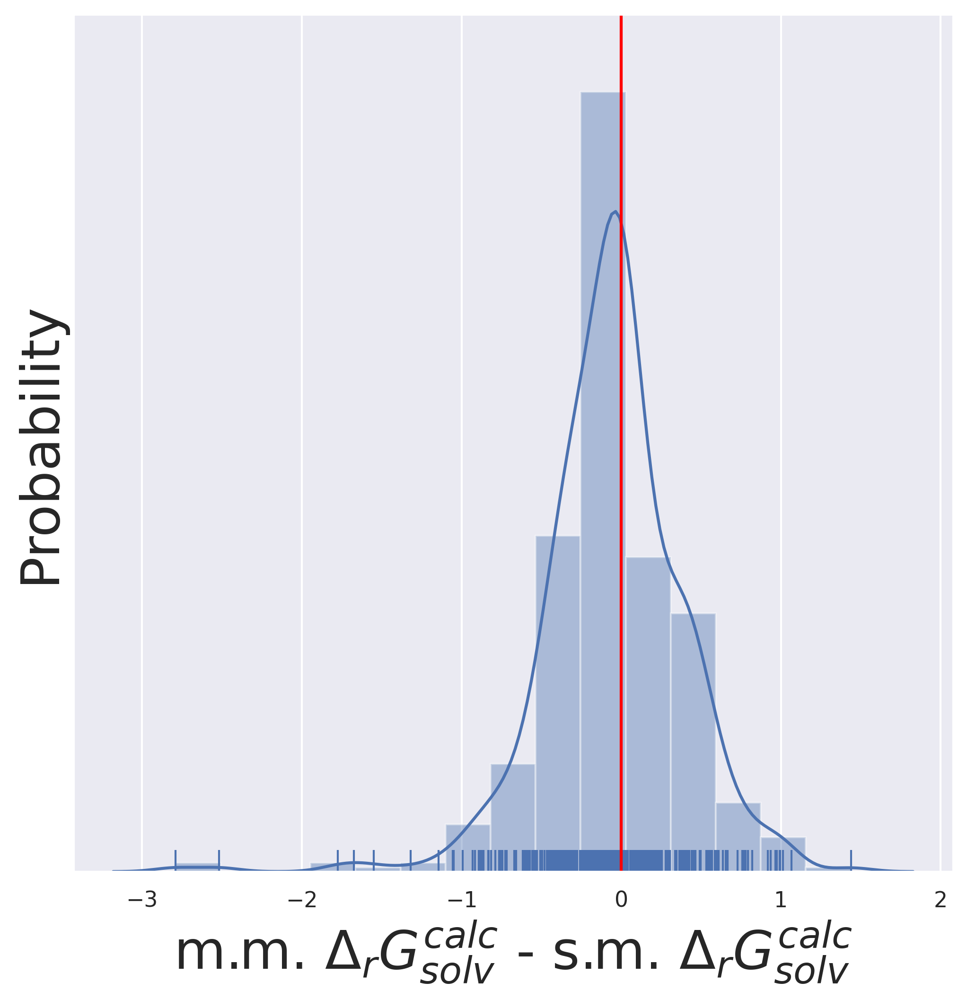

In [9]:
b3lyp_results = defaultdict(dict)
for name in sorted(qm_results.keys()):
    for t_name, smiles in zip(['t1', 't2'], qm_results[name]):
        
        vac_conf, solv_conf, m_vac, m_solv = combine_conformations(qm_results[name][smiles]['vac'], qm_results[name][smiles]['solv'])

        min_g = get_min_free_energy_in_solution_method1(m_solv, correct_for_symmetry=True)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method1-min"] = min_g
        mm = get_free_energy_in_solution_method1(solv_conf, m_solv, correct_for_symmetry=True)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method1-mm"], b3lyp_results[name][f"{t_name}-free-energy-solv-method1-minimas"]   = calculate_weighted_energy(mm), mm

        min_g = get_min_free_energy_in_solution_method2(m_vac, m_solv, correct_for_symmetry=True)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method2-min"]  = min_g
        mm = get_free_energy_in_solution_method2(vac_conf, m_vac, m_solv, correct_for_symmetry=True)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method2-mm"], b3lyp_results[name][f"{t_name}-free-energy-solv-method2-minimas"]   = calculate_weighted_energy(mm), mm

        min_g  = get_min_free_energy_in_solution_method3(m_vac, m_solv, correct_for_symmetry=True)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method3-min"] = min_g
        mm = get_free_energy_in_solution_method3(vac_conf, m_vac, m_solv, correct_for_symmetry=True)
        b3lyp_results[name][f"{t_name}-free-energy-solv-method3-mm"], b3lyp_results[name][f"{t_name}-free-energy-solv-method3-minimas"]   = calculate_weighted_energy(mm), mm

plt.figure(figsize=[8, 8], dpi=300)

            
for method in ['method1','method2', 'method3']:
    for combining_method in ['mm', 'min']:
        
        x_list, y_list, names, error, outlier = combine_y_and_exp(method, combining_method)
        f = plot_correlation_analysis(names, x_list, y_list, naming[method]['title'], naming[method]['x-axis'], naming[method]['y-axis'], fontsize=25, mark_point_by_name=outlier)
        plot_single_dist(x_list, y_list, label='')
        plot_diff(x_list, y_list)
    x_list, y_list, names, error = combine_x_and_y(method)
    f = plot_correlation_analysis(names, x_list, y_list, naming[method]['title'], f"multiple minima {naming[method]['y-axis']}" , f"single minimum {naming[method]['y-axis']}", fontsize=25)
    plot_single_dist(x_list, y_list, label='m.m. $\Delta_{r}G_{solv}^{calc}$ - s.m. $\Delta_{r}G_{solv}^{calc}$')

/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/mwieder/anaconda3/envs/ani36/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or 

<Figure size 2400x2400 with 0 Axes>

<Figure size 2400x2400 with 0 Axes>

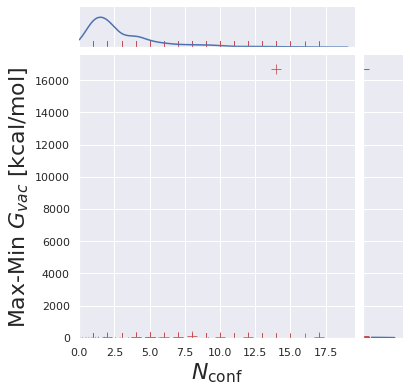

<Figure size 2400x2400 with 0 Axes>

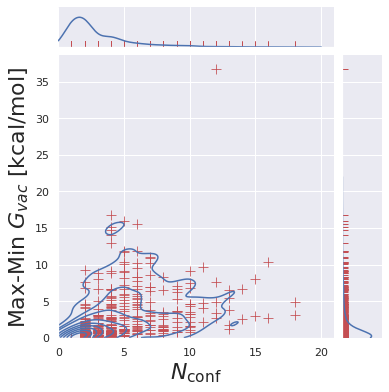

<Figure size 2400x2400 with 0 Axes>

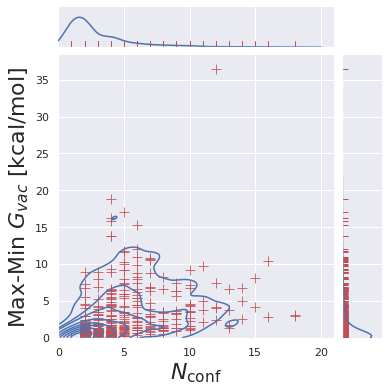

In [15]:
plt.figure(figsize=[8, 8], dpi=300)

for method in ['method1', 'method2', 'method3']:

    nr_of_min = []
    max_min = []
    names_t = []
    outliers_names = []
    for name in sorted(qm_results.keys()):

        mm1 = b3lyp_results[name][f"t1-free-energy-solv-{method}-minimas"]
        mm2 = b3lyp_results[name][f"t2-free-energy-solv-{method}-minimas"]
        nr_of_min.append(len(mm1))
        nr_of_min.append(len(mm2))


        t1_max_min = (max(mm1)-min(mm1)).value_in_unit(unit.kilocalorie_per_mole)
        t2_max_min = (max(mm2)-min(mm2)).value_in_unit(unit.kilocalorie_per_mole)

        max_min.append(t1_max_min)   
        max_min.append(t2_max_min)

        names_t.append((name, 't1'))
        names_t.append((name, 't2'))

        if t1_max_min > 10.0:
            outliers_names.append((name, 't1'))

        if t2_max_min > 10.0:
            outliers_names.append((name, 't2'))

    plt.figure(figsize=[8, 8], dpi=300)
    df = pd.DataFrame(zip(max_min, nr_of_min), columns =['Max-Min $G_{vac}$ [kcal/mol]', '$N_{\mathrm{conf}}$'])
    sns.set(rc={'figure.figsize':(8,8),"font.size":25,"axes.titlesize":25,"axes.labelsize":22})

    g = sns.jointplot("$N_{\mathrm{conf}}$", "Max-Min $G_{vac}$ [kcal/mol]", data=df, 
                     kind="kde",clip=(0, 20),marginal_kws={'clip':(0, 22)},
                      ratio=6)
    g.plot_joint(sns.scatterplot, color="r", marker="+", s=100)
    g.plot_marginals(sns.rugplot, color="r", height=.15, clip_on=True)#height=-.15, clip_on=True)
    from  matplotlib.ticker import FuncFormatter
    plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: int(x)))
    #g.savefig('/home/mwieder/min_max.svg', dpi=300)
    g

In [ ]:
obscure_dataset = ['SAMPLmol2', 'SAMPLmol4', 'molDWRow_982', 'molDWRow_1614', 'molDWRow_1005', 'molDWRow_999']

y_klamt_obscure = {'SAMPLmol2' : -5.74,
    'SAMPLmol4' : 0.46,
    'molDWRow_982': -4.01,
     'molDWRow_999': -7.71,
     'molDWRow_1614': -3.94,
     'molDWRow_1005': -7.61 
     
    }

y_ribeiro_obscure =  {'SAMPLmol2' : -5.7,
    'SAMPLmol4' : 0.8,
    'molDWRow_982': -3.0,
     'molDWRow_999': -6.7,
     'molDWRow_1614': -4.4,
     'molDWRow_1005': -9.7 }

y_kast_obscure =  {'SAMPLmol2' : -9.66,
    'SAMPLmol4' : -4.57,
    'molDWRow_982': -7.73,
     'molDWRow_999': -11.17,
     'molDWRow_1614': -6.16,
     'molDWRow_1005': -11.15 }

y_soteras_obscure =  {'SAMPLmol2' : -6.3,
    'SAMPLmol4' : 0.6,
    'molDWRow_982': -4.6,
     'molDWRow_999': -7.7,
     'molDWRow_1614': -5.6,
     'molDWRow_1005': -9.8 }


explanatory_dataset = ['molDWRow_506', 'molDWRow_504', 'molDWRow_505','molDWRow_1072', 'molDWRow_141', 'molDWRow_1058', 'molDWRow_1059', 'molDWRow_1514']

y_klamt_explanatory = {'molDWRow_506' : 1.83,
    'molDWRow_504' : -2.59,
    'molDWRow_505': -0.76,
     'molDWRow_1072': 1.91,
     'molDWRow_141': 5.28,
     'molDWRow_1058': 1.70,
       'molDWRow_1059' : 3.78,
       'molDWRow_1514' : 3.30
    }

y_ribeiro_explanatory =  {'molDWRow_506' : -1.2,
    'molDWRow_504' : 3.6,
    'molDWRow_505': 2.3,
     'molDWRow_1072': 0.8,
     'molDWRow_141': 6.5,
     'molDWRow_1058': 0.0,
           'molDWRow_1059' : 2.6,
           'molDWRow_1514' : 3.1
     
    }

y_kast_explanatory =  {'molDWRow_506' : -1.88,
    'molDWRow_504' : 0.02,
    'molDWRow_505': -1.87,
     'molDWRow_1072': 0.16,
     'molDWRow_141': 5.11,
     'molDWRow_1058': -2.84,
           'molDWRow_1059' : -0.55,
           'molDWRow_1514' : -0.79
     
    }

y_soteras_explanatory =  {'molDWRow_506' : 0.5,
    'molDWRow_504' : 0.9,
    'molDWRow_505': 1.4,
     'molDWRow_1072': 4.0,
     'molDWRow_141': 5.5,
     'molDWRow_1058': 2.2,
           'molDWRow_1059' : 5.0,
           'molDWRow_1514' : 3.0
     
    }
